# &emsp;&emsp;&emsp;&emsp; House Price Prediction: Advanced Regression Techniques

## 1. Problem Statement
 **Task 1:-** Prepare a complete *data analysis report* on the given data.<br>
 **Task 2:-a)** Create a robust *machine learning algorithm* to accurately predict the price of the house given the various factors across the market.<br>
&emsp;&emsp;&emsp;&nbsp;        **b)** Determine the *relationship between the house features* and how the price varies based on this.<br>
**Task3:-** Come up with suggestions for the *customer to buy* the house according to the area, price and other requirements.<br>

**Business Objective:** The primary business objective of this project is to analyze and understand the key factors that influence House Price. By applying Exploratory Data Analysis and Machine Learning techniques, the project aims to uncover how different features of House contribute to House  SalePrice. This understanding enables buyers to make data-driven decisions related to **predict the House Price**.

**Machine Leaning Type:** *Supervised Machine Learning: Regression Technique*

In [1]:
# Importing required libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import warnings 
warnings.filterwarnings("ignore")

# To see all columns/rows of DataFrame, if we refresh kernel, it will reset
pd.set_option('display.max_columns', None,'display.max_rows', None)

## 2. Loading the Dataset

In [2]:
df=pd.read_csv(r"C:\Datamites_DataScience_Course\Datamites Internship\House Price Prediction-Advance Regression\PRCP-1020-HousePricePred\data.csv")

## 3.  Basic Checks

In [3]:
# Checking the dimensions
print("No. of Rows in Dataset:",df.shape[0])
print("No. of Columns in Dataset:",df.shape[1])

No. of Rows in Dataset: 1460
No. of Columns in Dataset: 81


In [4]:
# Displaying the few rows of Dataset
df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,NaN,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,NaN,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

#### Identification of Datatypes present in Dataset
* As we know, after using `df.info()` there are 2 types of Datatypes: **Numerical** (like:`int64` and `float64`) and **Categorical** (like:`object`)

In [6]:
# Calculating the Statistical Summary of Numerical Columns
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Id,1460.0,730.500000,421.610009,1.0,365.75,730.5,1095.25,1460.0
MSSubClass,1460.0,56.897260,42.300571,20.0,20.00,50.0,70.00,190.0
LotFrontage,1201.0,70.049958,24.284752,21.0,59.00,69.0,80.00,313.0
LotArea,1460.0,10516.828082,9981.264932,1300.0,7553.50,9478.5,11601.50,215245.0
OverallQual,1460.0,6.099315,1.382997,1.0,5.00,6.0,7.00,10.0
OverallCond,1460.0,5.575342,1.112799,1.0,5.00,5.0,6.00,9.0
YearBuilt,1460.0,1971.267808,30.202904,1872.0,1954.00,1973.0,2000.00,2010.0
YearRemodAdd,1460.0,1984.865753,20.645407,1950.0,1967.00,1994.0,2004.00,2010.0
MasVnrArea,1452.0,103.685262,181.066207,0.0,0.00,0.0,166.00,1600.0
BsmtFinSF1,1460.0,443.639726,456.098091,0.0,0.00,383.5,712.25,5644.0


In [7]:
# Calculating the Statistical Summary of Categorical Columns
df.describe(include='object').T

,count,unique,top,freq
MSZoning,1460,5,RL,1151
Street,1460,2,Pave,1454
Alley,91,2,Grvl,50
LotShape,1460,4,Reg,925
LandContour,1460,4,Lvl,1311
Utilities,1460,2,AllPub,1459
LotConfig,1460,5,Inside,1052
LandSlope,1460,3,Gtl,1382
Neighborhood,1460,25,NAmes,225
Condition1,1460,9,Norm,1260


**Camputing column-wise Statistics for Numerical and Categorical Columns**

In [8]:
#  Camputing column-wise Statistics for Numerical Columns
num_cols=[feature for feature in df.columns if df[feature].dtype!='O']

print('Statistics(Median) for Numerical Columns:')
for col in num_cols:
    print('{}: {}'.format(col,df[col].median()))

Statistics(Median) for Numerical Columns:
Id: 730.5
MSSubClass: 50.0
LotFrontage: 69.0
LotArea: 9478.5
OverallQual: 6.0
OverallCond: 5.0
YearBuilt: 1973.0
YearRemodAdd: 1994.0
MasVnrArea: 0.0
BsmtFinSF1: 383.5
BsmtFinSF2: 0.0
BsmtUnfSF: 477.5
TotalBsmtSF: 991.5
1stFlrSF: 1087.0
2ndFlrSF: 0.0
LowQualFinSF: 0.0
GrLivArea: 1464.0
BsmtFullBath: 0.0
BsmtHalfBath: 0.0
FullBath: 2.0
HalfBath: 0.0
BedroomAbvGr: 3.0
KitchenAbvGr: 1.0
TotRmsAbvGrd: 6.0
Fireplaces: 1.0
GarageYrBlt: 1980.0
GarageCars: 2.0
GarageArea: 480.0
WoodDeckSF: 0.0
OpenPorchSF: 25.0
EnclosedPorch: 0.0
3SsnPorch: 0.0
ScreenPorch: 0.0
PoolArea: 0.0
MiscVal: 0.0
MoSold: 6.0
YrSold: 2008.0
SalePrice: 163000.0


In [9]:
#  Camputing column-wise Statistics for Categorical Columns
cat_cols=[feature for feature in df.columns if df[feature].dtype=='O']

print('Statistics(Mode) for Categorical Columns:\n')
for col in cat_cols:
    print('{}: {}'.format(col,df[col].mode()))
    print('='*20)

Statistics(Mode) for Categorical Columns:

MSZoning: 0    RL
Name: MSZoning, dtype: object
Street: 0    Pave
Name: Street, dtype: object
Alley: 0    Grvl
Name: Alley, dtype: object
LotShape: 0    Reg
Name: LotShape, dtype: object
LandContour: 0    Lvl
Name: LandContour, dtype: object
Utilities: 0    AllPub
Name: Utilities, dtype: object
LotConfig: 0    Inside
Name: LotConfig, dtype: object
LandSlope: 0    Gtl
Name: LandSlope, dtype: object
Neighborhood: 0    NAmes
Name: Neighborhood, dtype: object
Condition1: 0    Norm
Name: Condition1, dtype: object
Condition2: 0    Norm
Name: Condition2, dtype: object
BldgType: 0    1Fam
Name: BldgType, dtype: object
HouseStyle: 0    1Story
Name: HouseStyle, dtype: object
RoofStyle: 0    Gable
Name: RoofStyle, dtype: object
RoofMatl: 0    CompShg
Name: RoofMatl, dtype: object
Exterior1st: 0    VinylSd
Name: Exterior1st, dtype: object
Exterior2nd: 0    VinylSd
Name: Exterior2nd, dtype: object
MasVnrType: 0    BrkFace
Name: MasVnrType, dtype: object
Ex

In [10]:
# Checking Missing Values
data=df.copy()
missing = data.isnull().sum()
missing = missing[missing>0].sort_values(ascending=False)
print(missing)

PoolQC          1453
MiscFeature     1406
Alley           1369
Fence           1179
MasVnrType       872
FireplaceQu      690
LotFrontage      259
GarageType        81
GarageYrBlt       81
GarageFinish      81
GarageQual        81
GarageCond        81
BsmtFinType2      38
BsmtExposure      38
BsmtFinType1      37
BsmtCond          37
BsmtQual          37
MasVnrArea         8
Electrical         1
dtype: int64


## 4. Exploratory Data Analysis(EDA)

### Analysis of Missing Values 

In [11]:
# Fetching the Independent Features with Missing Values
features_with_na=[features for features in df.columns if df[features].isnull().sum()>0]  

for features in features_with_na:
    print('{}: {}% missing values'.format(features, np.round(df[features].isnull().mean()*100,4)))

LotFrontage: 17.7397% missing values
Alley: 93.7671% missing values
MasVnrType: 59.726% missing values
MasVnrArea: 0.5479% missing values
BsmtQual: 2.5342% missing values
BsmtCond: 2.5342% missing values
BsmtExposure: 2.6027% missing values
BsmtFinType1: 2.5342% missing values
BsmtFinType2: 2.6027% missing values
Electrical: 0.0685% missing values
FireplaceQu: 47.2603% missing values
GarageType: 5.5479% missing values
GarageYrBlt: 5.5479% missing values
GarageFinish: 5.5479% missing values
GarageQual: 5.5479% missing values
GarageCond: 5.5479% missing values
PoolQC: 99.5205% missing values
Fence: 80.7534% missing values
MiscFeature: 96.3014% missing values


In [12]:
# Numerical Features with Nulls
num_features_na=[feature for feature in df[features_with_na] if df[feature].dtype!='O']

print('Number Features with Missing Values:',num_features_na)
print('No. of Number Features with Missing Values:',len(num_features_na))

Number Features with Missing Values: ['LotFrontage', 'MasVnrArea', 'GarageYrBlt']
No. of Number Features with Missing Values: 3


In [13]:
# Categorical Features with Nulls
cat_features_na=[feature for feature in df[features_with_na] if df[feature].dtype=='O']

print('Categorical Features with Missing Values:',cat_features_na)
print('No. of Categorical Features with Missing Values:',len(cat_features_na))

Categorical Features with Missing Values: ['Alley', 'MasVnrType', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Electrical', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PoolQC', 'Fence', 'MiscFeature']
No. of Categorical Features with Missing Values: 16


#### Visualizing Missing values in Dataset

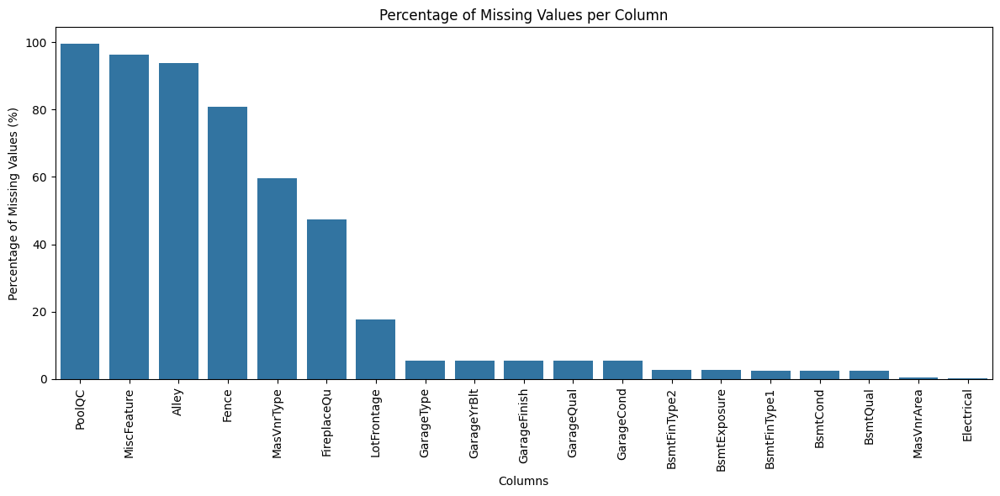

In [14]:
# 1. Identify features with % of missing values and sort them
missing_perc = df[features_with_na].isnull().mean().sort_values(ascending=False) * 100

# 2. Plot using the sorted Series
plt.figure(figsize=(12, 6))
sns.barplot(x=missing_perc.index, y=missing_perc.values)

plt.xlabel('Columns')
plt.ylabel('Percentage of Missing Values (%)')
plt.title('Percentage of Missing Values per Column')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

### Numerical Features Analysis

In [15]:
# 1. Get all numerical columns
#num_cols = df.select_dtypes(include=['number']).columns
numerical_features = [feature for feature in df.columns if df[feature].dtype !='object' and feature !='Id']
# 2. Filter that list to only include those with missing values
num_feature_with_na = [feature for feature in numerical_features if df[feature].isnull().sum() > 0]
print("Length Of Numerical Features:",len(numerical_features),'\n')
print("Numerical Features:",numerical_features,"\n")
print("Numerical Features with Nulls:",num_feature_with_na,",and they are:",len(num_feature_with_na))

Length Of Numerical Features: 37 

Numerical Features: ['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal', 'MoSold', 'YrSold', 'SalePrice'] 

Numerical Features with Nulls: ['LotFrontage', 'MasVnrArea', 'GarageYrBlt'] ,and they are: 3


In [16]:
df[numerical_features].head()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
0,60,65.0,8450,7,5,2003,2003,196.0,706,0,150,856,856,854,0,1710,1,0,2,1,3,1,8,0,2003.0,2,548,0,61,0,0,0,0,0,2,2008,208500
1,20,80.0,9600,6,8,1976,1976,0.0,978,0,284,1262,1262,0,0,1262,0,1,2,0,3,1,6,1,1976.0,2,460,298,0,0,0,0,0,0,5,2007,181500
2,60,68.0,11250,7,5,2001,2002,162.0,486,0,434,920,920,866,0,1786,1,0,2,1,3,1,6,1,2001.0,2,608,0,42,0,0,0,0,0,9,2008,223500
3,70,60.0,9550,7,5,1915,1970,0.0,216,0,540,756,961,756,0,1717,1,0,1,0,3,1,7,1,1998.0,3,642,0,35,272,0,0,0,0,2,2006,140000
4,60,84.0,14260,8,5,2000,2000,350.0,655,0,490,1145,1145,1053,0,2198,1,0,2,1,4,1,9,1,2000.0,3,836,192,84,0,0,0,0,0,12,2008,250000


#### Numerical Columns Distribution 


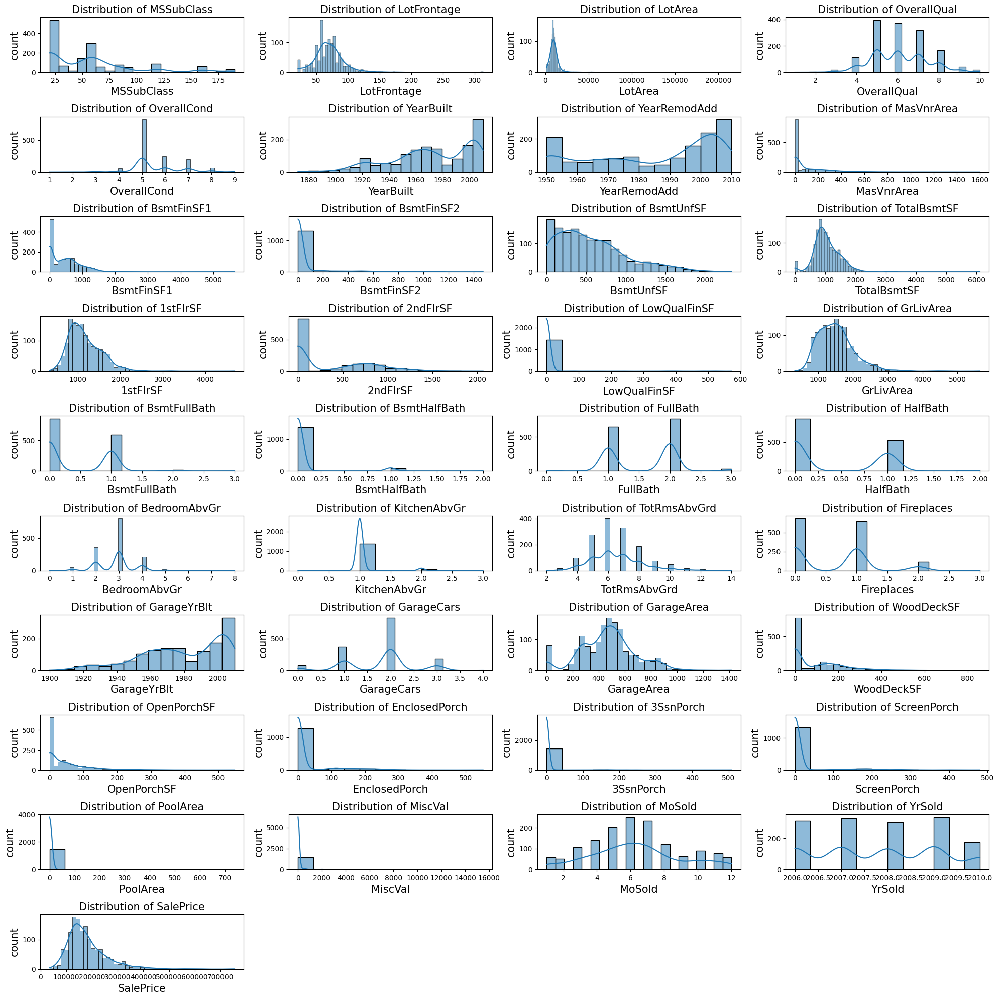

In [17]:
# Histogram of Numerical Columns
plt.figure(figsize=(20,20)) # To fix the canvas size
plotnumber=1 # initializing plot number
for feature in numerical_features:
    plt.subplot(10,4,plotnumber) #10*4=40, means we are trying to print 40 subplots 
    sns.histplot(df[feature],kde=True)
    plt.title(f'Distribution of {feature}',fontsize=15)
    plt.xlabel(feature,fontsize=15)
    plt.ylabel('count',fontsize=15)
    plotnumber+=1
plt.tight_layout() # using tight layout to adjust the shape and do not overlap the figures
plt.show()

### Analysis of Target Variable (SalePrice)

* To analyze SalePrice, We have to draw it distribution of Target Varible.
* We will generate Histogram with Kernel Density Estimator(kde) with bin=25 

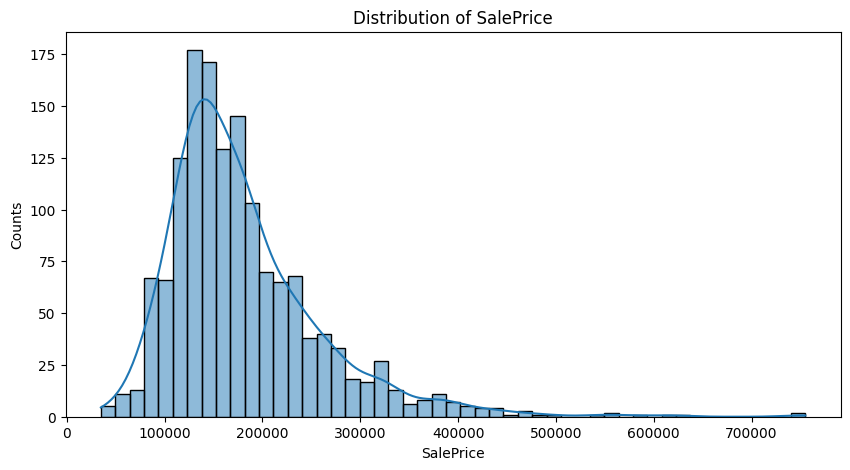

In [18]:
# Generating Histogram for SalePrice with kde curve
plt.figure(figsize=(10,5))
sns.histplot(df['SalePrice'], kde=True)
plt.title('Distribution of SalePrice')
plt.xlabel('SalePrice')
plt.ylabel('Counts')
plt.show()

#### Insights:
**Histogram of SalePrice:** There are `outliers` in SalePrice, so that `skewness` and `kurtosis` in distribution.
We have to find the Skewness and kurtosis in SalePrice.


#### checking Outliers in SalePrice

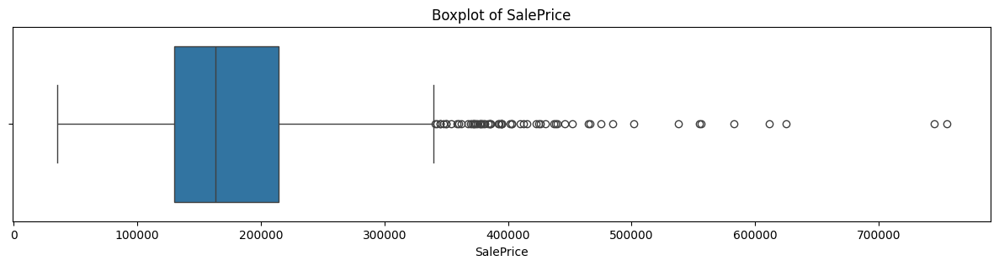

In [19]:
# Outlier detection in SalePrice using boxplot
plt.figure(figsize=(15,3))
sns.boxplot(df['SalePrice'],orient='h')
plt.title('Boxplot of SalePrice')
plt.show()

In [20]:
skewness=df['SalePrice'].skew()
kurtosis=df['SalePrice'].kurt()
print("Descriptive Statistics for SalePrice:\n",df['SalePrice'].describe().T,'\n')
print(f"Skewness: {skewness:.4f}")
print(f"Kurtosis: {kurtosis:.4f}")

Descriptive Statistics for SalePrice:
 count      1460.000000
mean     180921.195890
std       79442.502883
min       34900.000000
25%      129975.000000
50%      163000.000000
75%      214000.000000
max      755000.000000
Name: SalePrice, dtype: float64 

Skewness: 1.8829
Kurtosis: 6.5363


#### Insights of SalePrice Distribution:
**Skewness:** `skewness>1` i.e SalePrice distribution is **highly skewed (Right)** <br>
**Kurtosis:** `kurtosis>3` i.e SalePrice distribution is **Leptokurtic**

### Analysis of Numerical Features with SalePrice

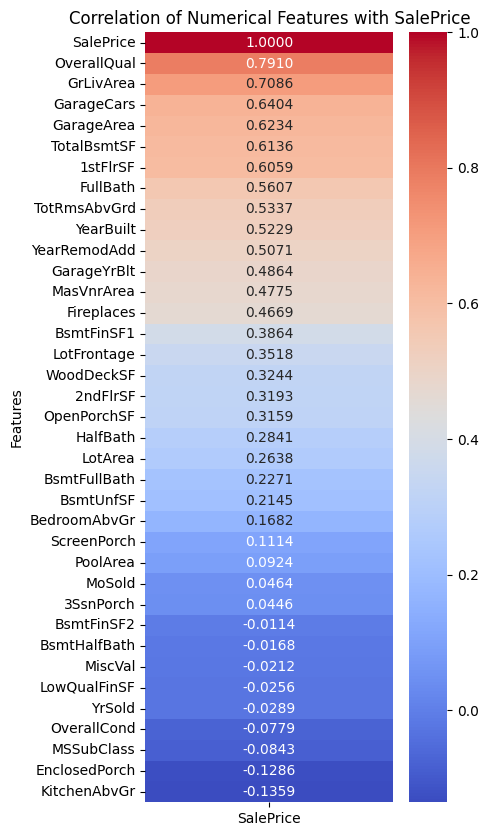

In [21]:
# 1.Finding the Correlation of Numerical Features
correltion_matrix=df[numerical_features].corr()
# 2.Finding the Correlation of SalePrice with Numerical Features
sale_price_correlations=correltion_matrix['SalePrice'].sort_values(ascending=False)
# 3. Drawing Heatmap for showing correlation of SalePrice with Numerical Features
plt.figure(figsize=(4,10))
sns.heatmap(sale_price_correlations.to_frame(), annot=True, cmap='coolwarm', fmt=".4f")
plt.title('Correlation of Numerical Features with SalePrice')
plt.ylabel('Features')
plt.show()

### Analysis of Temporal Variables (Datetime variables)
* Here in dataset we have year related data, which are temporal vriables.<br>
* We have to analyze these temporal variable and find the relationship of them, with SalePrice

In [22]:
# Featching years/time related features from numerical features
year_fetures=[feature for feature in numerical_features if 'Year' in feature or 'Yr' in feature]
print(year_fetures)

['YearBuilt', 'YearRemodAdd', 'GarageYrBlt', 'YrSold']


### Insights:
**Temporal Variables:(Eg. datetime variables)**
* Here in this Dataset, total 4 features are year features.
* `YearBuilt`: Original construction date
* `YearRemodAdd`: Remodel date (same as construction date if no remodeling or additions)
* `GarageYrBlt`: Year garage was built
* `YrSold`: Year Sold (YYYY)

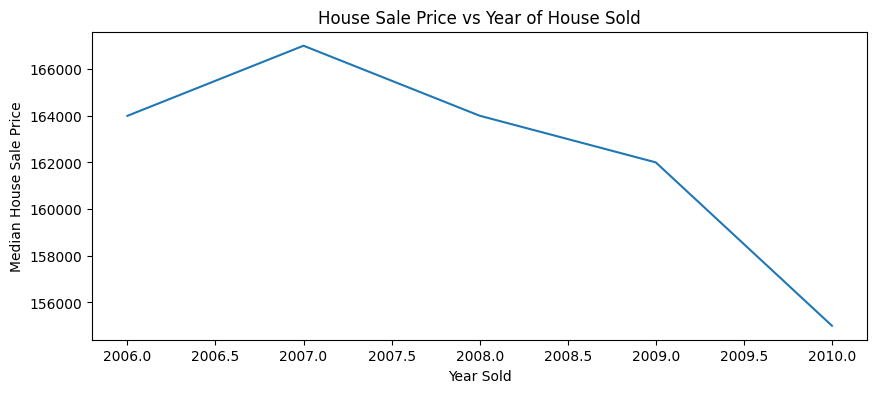

In [23]:
# Let analyze the temporal variable(YrSold) with dependent variable(SalePrice)
plt.figure(figsize=(10,4))
df.groupby('YrSold')['SalePrice'].median().plot()
plt.xlabel('Year Sold')
plt.ylabel('Median House Sale Price')
plt.title('House Sale Price vs Year of House Sold')
plt.show()  

### Insights:
* As we can see in the above plot, the **House Price is decreasing as per Year increases**

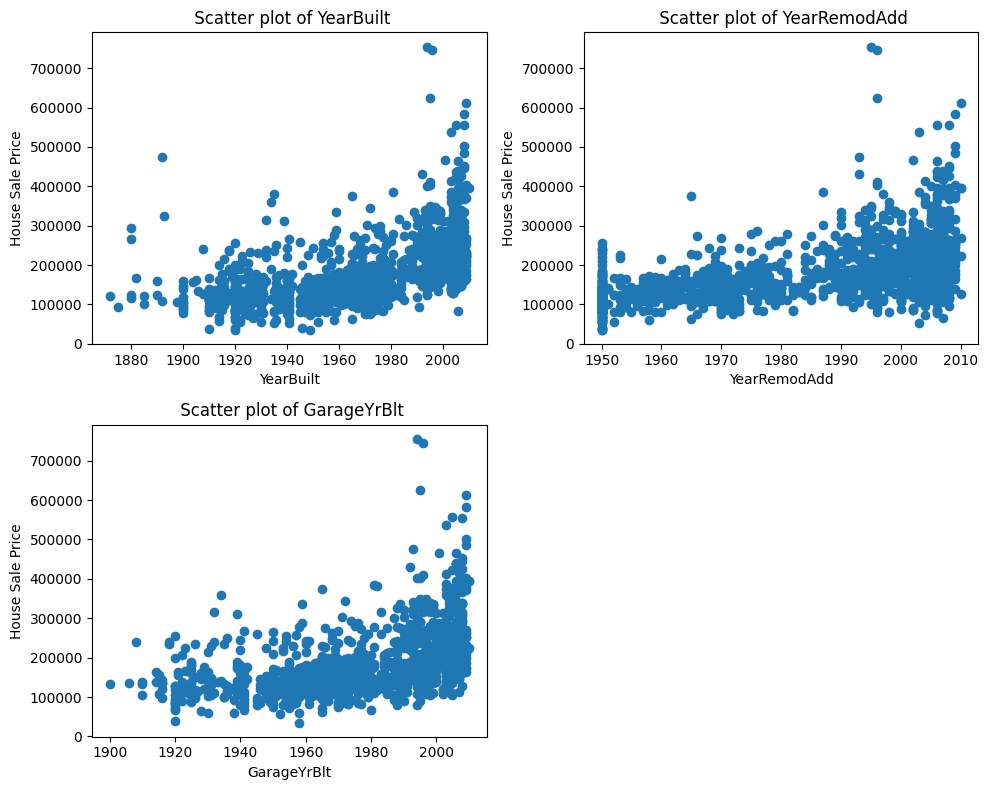

In [24]:
# Now we compare the other Year related features with SalePrice
plt.figure(figsize=(10,8))
plotnumber=1
for feature in year_fetures:
    if feature!='YrSold':
        data=df.copy()
        plt.subplot(2,2,plotnumber)
        #plt.figure(figsize=(8,4))
        plt.scatter(data[feature], data['SalePrice'])
        plt.title(f' Scatter plot of {feature}')
        plt.xlabel(feature)
        plt.ylabel('House Sale Price')
        plotnumber+=1
plt.tight_layout()
plt.show()

### Insights:
* **YearBuilt,YearRemodAdd, GarageYrBlt:** As we can see in the above scatter plots, House Sales are more for Newly Built or Remodelled house or New Garage Built houses.

As we know that Numerical Variable are 2 types: `Continuous` and `Discrete` Variable.<br>
Total `Numerical Features` in Dataset is `38`.

In [25]:
df[numerical_features].head()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
0,60,65.0,8450,7,5,2003,2003,196.0,706,0,150,856,856,854,0,1710,1,0,2,1,3,1,8,0,2003.0,2,548,0,61,0,0,0,0,0,2,2008,208500
1,20,80.0,9600,6,8,1976,1976,0.0,978,0,284,1262,1262,0,0,1262,0,1,2,0,3,1,6,1,1976.0,2,460,298,0,0,0,0,0,0,5,2007,181500
2,60,68.0,11250,7,5,2001,2002,162.0,486,0,434,920,920,866,0,1786,1,0,2,1,3,1,6,1,2001.0,2,608,0,42,0,0,0,0,0,9,2008,223500
3,70,60.0,9550,7,5,1915,1970,0.0,216,0,540,756,961,756,0,1717,1,0,1,0,3,1,7,1,1998.0,3,642,0,35,272,0,0,0,0,2,2006,140000
4,60,84.0,14260,8,5,2000,2000,350.0,655,0,490,1145,1145,1053,0,2198,1,0,2,1,4,1,9,1,2000.0,3,836,192,84,0,0,0,0,0,12,2008,250000


### Discrete Features

In [26]:
# Now we are fetching Discrete Variables
discrete_features=[feature for feature in numerical_features if len(df[feature].unique())<=25 and feature not in year_fetures+['Id']]
print('No. of Discrete Features:',len(discrete_features),'\n')
print(discrete_features)

No. of Discrete Features: 17 

['MSSubClass', 'OverallQual', 'OverallCond', 'LowQualFinSF', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageCars', '3SsnPorch', 'PoolArea', 'MiscVal', 'MoSold']


In [27]:
df[discrete_features].head()

,MSSubClass,OverallQual,OverallCond,LowQualFinSF,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,3SsnPorch,PoolArea,MiscVal,MoSold
0,60,7,5,0,1,0,2,1,3,1,8,0,2,0,0,0,2
1,20,6,8,0,0,1,2,0,3,1,6,1,2,0,0,0,5
2,60,7,5,0,1,0,2,1,3,1,6,1,2,0,0,0,9
3,70,7,5,0,1,0,1,0,3,1,7,1,3,0,0,0,2
4,60,8,5,0,1,0,2,1,4,1,9,1,3,0,0,0,12


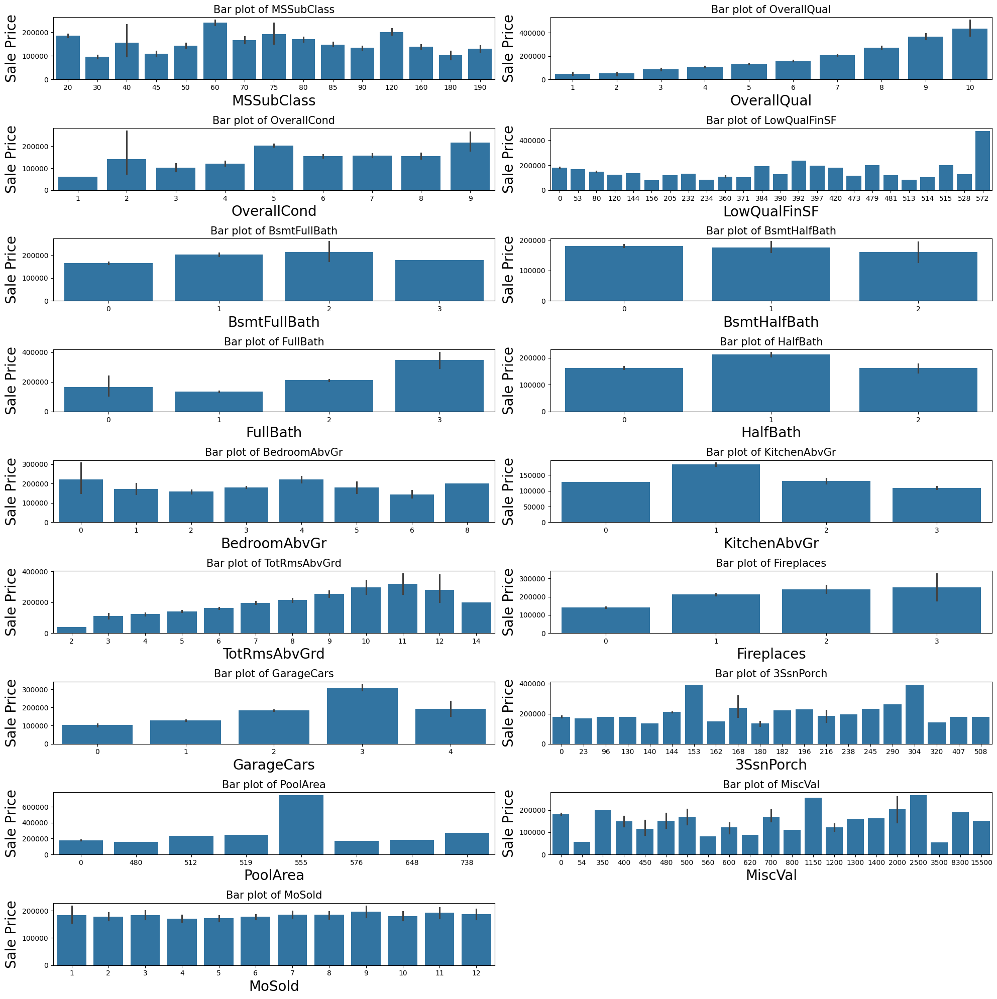

In [28]:
# Find the relationship between Discrete Features and SalePrice(Dependent Feature)
plt.figure(figsize=(20,20))
plotnumber=1
for feature in discrete_features:
    data=df.copy()
    plt.subplot(9,2,plotnumber)
    #data.groupby(feature)['SalePrice'].median().plot.bar()
    sns.barplot(x=df[feature],y=df['SalePrice'])
    plt.xlabel(feature,fontsize=20)
    plt.ylabel('Sale Price',fontsize=20)
    plt.title(f'Bar plot of {feature}',fontsize=15)
    plotnumber+=1
plt.tight_layout()
plt.show()

### Continuous Features

In [29]:
# Now we are fetching Continous Variables
continuous_features=[feature for feature in numerical_features if feature not in discrete_features+year_fetures+['Id']]
print('No. of Continous Features:',len(continuous_features),'\n')
print('Continuous Features:\n',continuous_features)

No. of Continous Features: 16 

Continuous Features:
 ['LotFrontage', 'LotArea', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'GrLivArea', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', 'ScreenPorch', 'SalePrice']


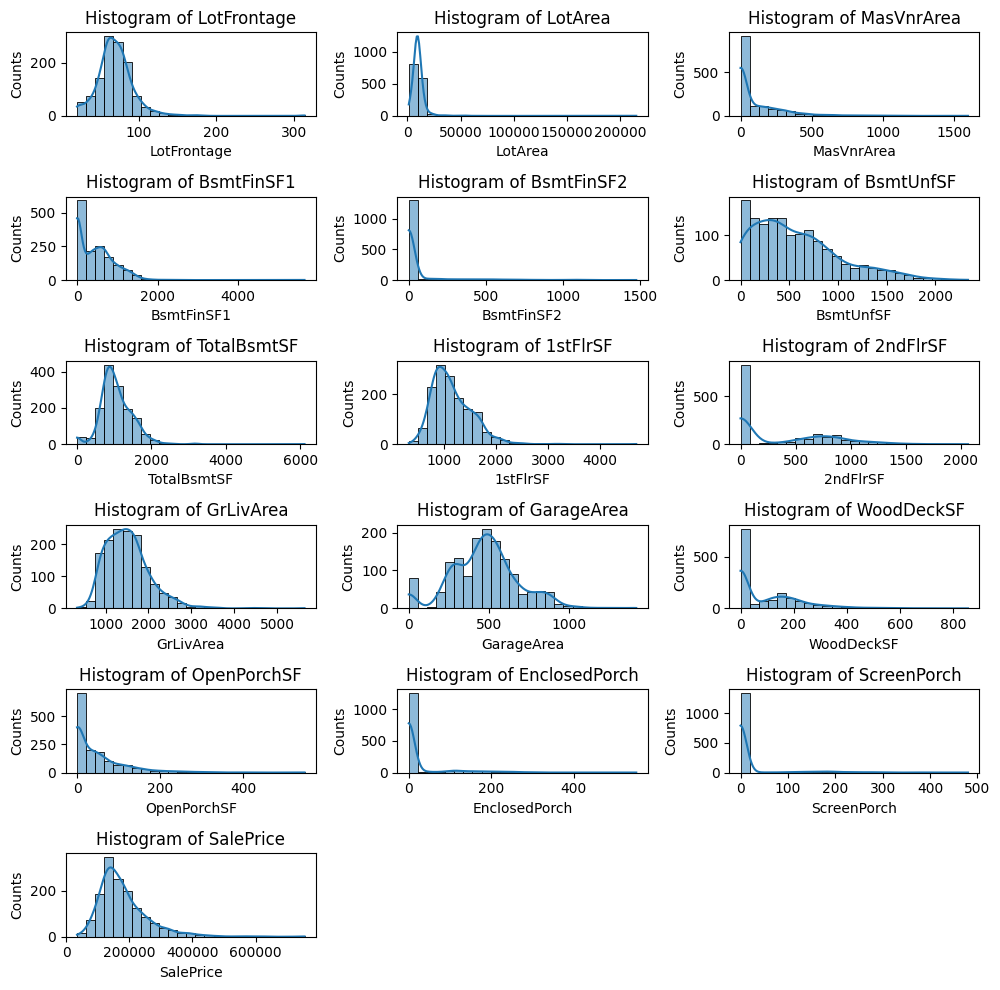

In [30]:
# Analysing Continous features by creating the Histogram to understand the distribution of Continuous values
plt.figure(figsize=(10,10))
plotnumber=1
for feature in continuous_features:
    data=df.copy()
    plt.subplot(6, 3,plotnumber)
    sns.histplot(data[feature], bins=25, kde=True)
    plt.xlabel(feature,fontsize=10)
    plt.ylabel('Counts',fontsize=10)
    plt.title(f'Histogram of {feature}')
    plotnumber+=1
plt.tight_layout()
plt.show()

### Insights:
As we can see the Kernel Density Estimator(kde) curve of Histogram of Continuous variables are **not Normally Distributed** i.e Distribution is Skewed, so that we have to apply **Log Transformation** on these continuous variables for checking.

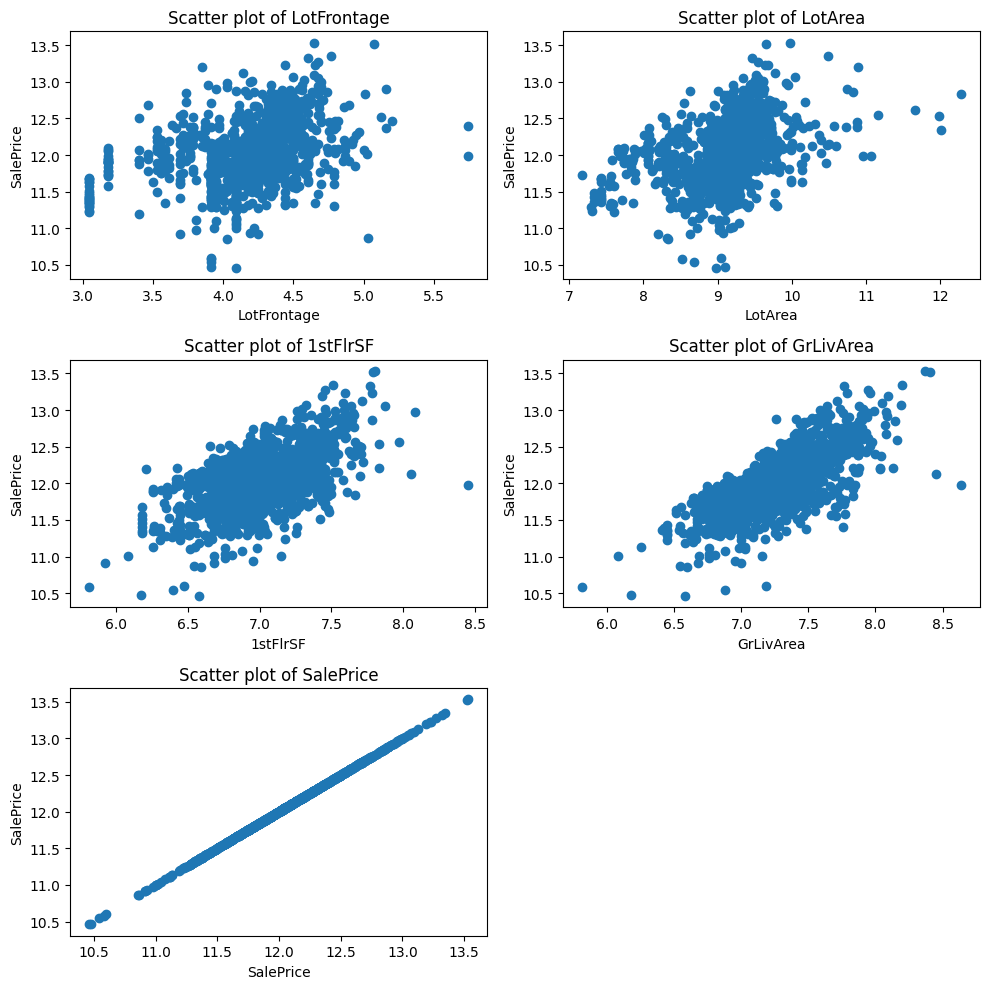

In [31]:
# Applying Log Transformation on Continuous Variables
plt.figure(figsize=(10,10))
plotnumber=1
for feature in continuous_features:
    data=df.copy()
    if 0 in data[feature].unique():
        # This check is a safety mechanism to prevent your code from crashing with a mathematical error, log0=1.
        pass
    else:
       plt.subplot(3,2,plotnumber)
       data[feature]=np.log(df[feature])
       data['SalePrice']=np.log(df['SalePrice'])
       plt.scatter(data[feature], data['SalePrice'])
       plt.xlabel(feature)
       plt.ylabel('SalePrice')
       plt.title(f'Scatter plot of {feature}')
       plotnumber+=1
plt.tight_layout()
plt.show() 

### Checking Correlation of continuous features

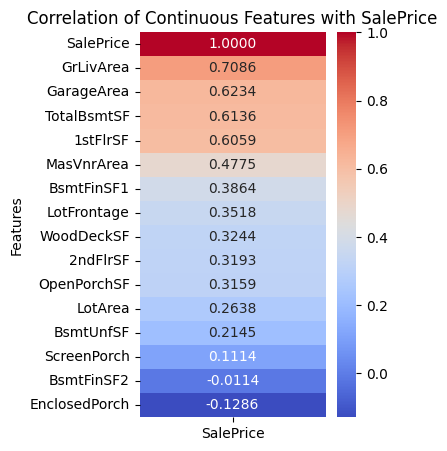

In [32]:
# 1.Finding the Correlation of Continuous Features
continuous_feature_corr_mat=df[continuous_features].corr()
# 2.Finding the Correlation of SalePrice with Continuous Features
saleprice_continuous_feature_corr=continuous_feature_corr_mat['SalePrice'].sort_values(ascending=False)
# 3. Drawing Heatmap for showing correlation of SalePrice with Continuous Features
plt.figure(figsize=(3,5))
sns.heatmap(saleprice_continuous_feature_corr.to_frame(), annot=True, cmap='coolwarm', fmt=".4f")
plt.title('Correlation of Continuous Features with SalePrice')
plt.ylabel('Features')
plt.show()

### Outliers Analysis

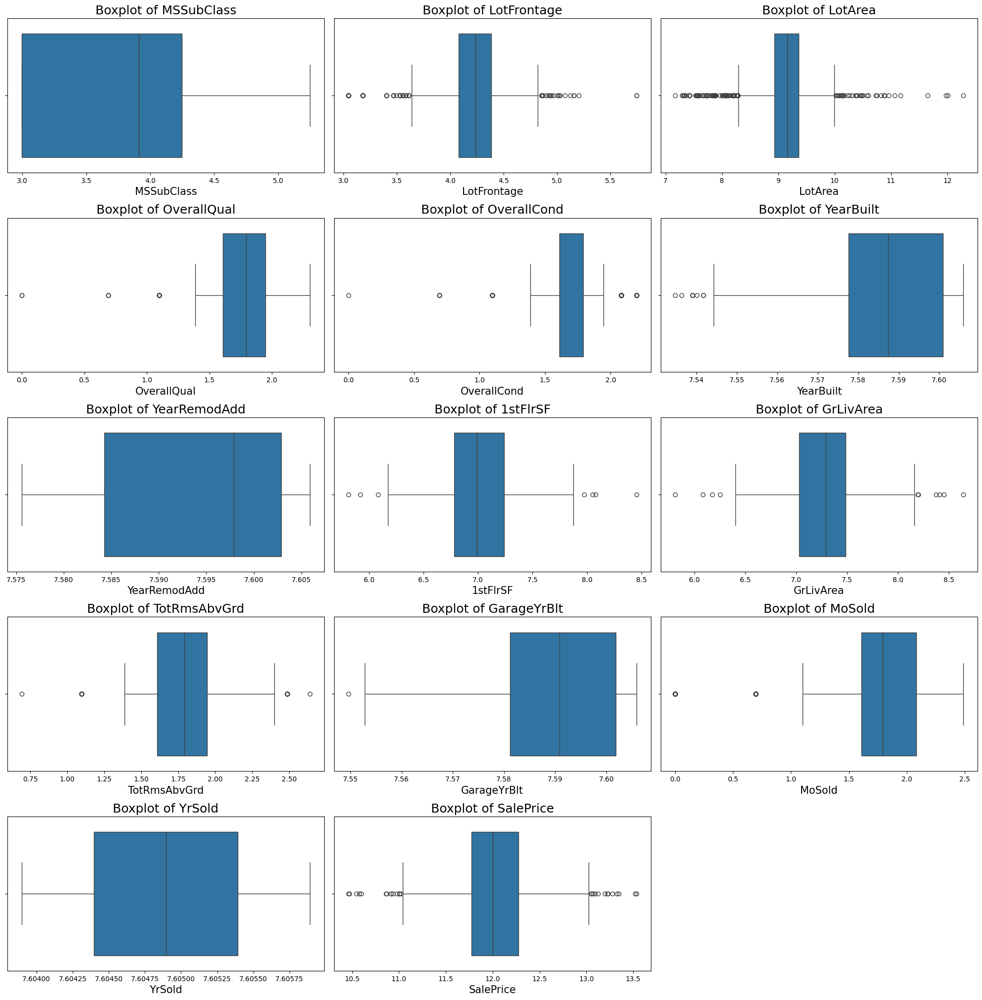

In [33]:
# Checking Outliers for Numerical features which donot conatains 0
plt.figure(figsize=(20,40))
plotnumber=1
for feature in numerical_features:
    data=df.copy()
    if 0 in data[feature].unique():
        # This check is a safety mechanism to prevent your code from crashing with a mathematical error, log0=1.
        pass
    else:
        plt.subplot(10,3,plotnumber)
        data[feature]=np.log(df[feature])
        sns.boxplot(x=data[feature])
        plt.xlabel(feature,fontsize=15)
        plt.title(f'Boxplot of {feature}',fontsize=18)
        plotnumber+=1
plt.tight_layout()
plt.show()

### Categorical Features

In [34]:
# 1. Get all categorical columns
#cat_cols = df.select_dtypes(exclude=['number']).columns
categorical_features = [features for features in df.columns if df[features].dtype =='object']
# 2. Filter that list to only include those with missing values
cat_feature_with_na = [feature for feature in categorical_features if df[feature].isnull().sum() > 0]

print("Length Of Categorical Features:",len(categorical_features),'\n')
print("Categorical Features:",categorical_features,'\n')
print("Categorical Features with Missing values:",cat_feature_with_na ,",and they are:",len(cat_feature_with_na))

Length Of Categorical Features: 43 

Categorical Features: ['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'PoolQC', 'Fence', 'MiscFeature', 'SaleType', 'SaleCondition'] 

Categorical Features with Missing values: ['Alley', 'MasVnrType', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Electrical', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PoolQC', 'Fence', 'MiscFeature'] ,and they are: 16


In [35]:
df[categorical_features].head()

,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,FireplaceQu,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,PoolQC,Fence,MiscFeature,SaleType,SaleCondition
0,RL,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,No,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,NaN,Attchd,RFn,TA,TA,Y,NaN,NaN,NaN,WD,Normal
1,RL,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,Gable,CompShg,MetalSd,MetalSd,NaN,TA,TA,CBlock,Gd,TA,Gd,ALQ,Unf,GasA,Ex,Y,SBrkr,TA,Typ,TA,Attchd,RFn,TA,TA,Y,NaN,NaN,NaN,WD,Normal
2,RL,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,Mn,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,TA,Attchd,RFn,TA,TA,Y,NaN,NaN,NaN,WD,Normal
3,RL,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,Gable,CompShg,Wd Sdng,Wd Shng,NaN,TA,TA,BrkTil,TA,Gd,No,ALQ,Unf,GasA,Gd,Y,SBrkr,Gd,Typ,Gd,Detchd,Unf,TA,TA,Y,NaN,NaN,NaN,WD,Abnorml
4,RL,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,Av,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,TA,Attchd,RFn,TA,TA,Y,NaN,NaN,NaN,WD,Normal


In [36]:
for feature in categorical_features:
    print('The feature is {}, the unique categories are: {} and lenght :{}'.format(feature,df[feature].unique(),len(df[feature].unique())),'\n')

The feature is MSZoning, the unique categories are: ['RL' 'RM' 'C (all)' 'FV' 'RH'] and lenght :5 

The feature is Street, the unique categories are: ['Pave' 'Grvl'] and lenght :2 

The feature is Alley, the unique categories are: [nan 'Grvl' 'Pave'] and lenght :3 

The feature is LotShape, the unique categories are: ['Reg' 'IR1' 'IR2' 'IR3'] and lenght :4 

The feature is LandContour, the unique categories are: ['Lvl' 'Bnk' 'Low' 'HLS'] and lenght :4 

The feature is Utilities, the unique categories are: ['AllPub' 'NoSeWa'] and lenght :2 

The feature is LotConfig, the unique categories are: ['Inside' 'FR2' 'Corner' 'CulDSac' 'FR3'] and lenght :5 

The feature is LandSlope, the unique categories are: ['Gtl' 'Mod' 'Sev'] and lenght :3 

The feature is Neighborhood, the unique categories are: ['CollgCr' 'Veenker' 'Crawfor' 'NoRidge' 'Mitchel' 'Somerst' 'NWAmes'
 'OldTown' 'BrkSide' 'Sawyer' 'NridgHt' 'NAmes' 'SawyerW' 'IDOTRR'
 'MeadowV' 'Edwards' 'Timber' 'Gilbert' 'StoneBr' 'ClearCr' 

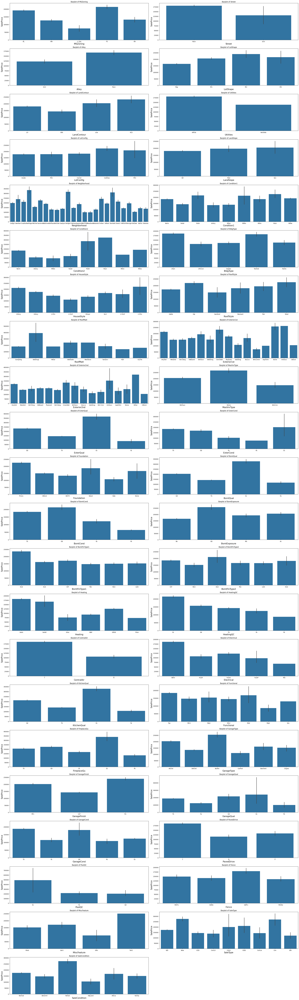

In [37]:
# # Finding the relationship between categorical variables and Dependent feature(SalePrice)
plt.figure(figsize=(30,100))
plotnumber=1
for feature in categorical_features:
    data=df.copy()
    plt.subplot(22,2,plotnumber)
    sns.barplot(x=df[feature],y=df['SalePrice'])
    plt.title(f'Barplot of {feature}')
    plt.xlabel(feature,fontsize=15)
    plt.ylabel('SalePrice',fontsize=15)
    plotnumber+=1
plt.tight_layout()
plt.show()

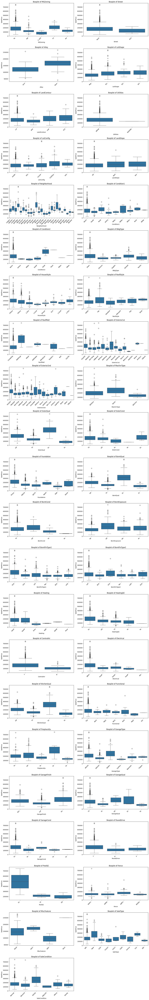

In [38]:
# Outliers detection of Categorical Features with SalePrice
plt.figure(figsize=(15,100))
plotnumber=1
for feature in categorical_features:
    data=df.copy()
    plt.subplot(22,2,plotnumber)
    sns.boxplot(x=data[feature], y=data['SalePrice'])
    plt.title(f'Boxplot of {feature}')
    plt.xlabel(feature)
    plt.ylabel('SalePrice')
    plt.xticks(rotation=45, ha='right')
    plotnumber+=1
plt.tight_layout()
plt.show()

### Dropping unnecessary and too many missing values columns
* `Id`: Unnecessary column
* `PoolQC`,`MiscFeature`,`Alley`,`Fence`: Missing value % is around 80% or above so removed

In [39]:
# Dropping highly missing values columns
df = df.drop(columns=['Id','PoolQC','MiscFeature','Alley','Fence'])

In [40]:
df.shape

(1460, 76)

## Data Analysis Report
*   **Data Types**: Columns were successfully categorized into numerical and categorical types for further analysis. There are 38 numerical columns and 43 categorical columns in the dataset.
* **Missing Values**: 
  * **Numerical Features with Missing Values :** `LotFrontage`, `MasVnrArea`, `GarageYrBlt`
  * **Categorical Features with Missing Values:** `Alley`, `MasVnrType`, `BsmtQual`, `BsmtCond`, `BsmtExposure`, `BsmtFinType1`, `BsmtFinType2`, `Electrical`, `FireplaceQu`, `GarageType`, `GarageFinish`, `GarageQual`, `GarageCond`, `PoolQC`, `Fence`, `MiscFeature`
  * **Most Missing Values Fetures:** 
    * `PoolQC`, `Alley`,`MiscFeature`,`Fence` have more than `80%` have missing values. So dropped these features  before Feature Engineering.
    * `Id` is irrelevent feature, so I dropped that also before Feature Engineering.

*   **Target Variable (`SalePrice`) Distribution:**
    *   The `SalePrice` distribution is right-skewed, with a **skewness** of `1.8829`, indicating a longer tail on the right side.
    *   It exhibits a high kurtosis of `6.5363`, suggesting heavy tails and the presence of numerous outliers, particularly on the higher end of prices.
    *   Key statistics show a mean of `180921.20$`, a median of `163,000.00$`, and a standard deviation of `79,442.50$`, with prices ranging from `34,900.00$` to `755,000.00$`.
*   **Correlation with `SalePrice` (Numerical Features):**
    *   `OverallQual` shows the strongest positive correlation with `SalePrice` (`0.79`).
    *   Other highly positively correlated features include `GrLivArea` (`0.71`), `GarageCars` (`0.64`), `GarageArea` (`0.62`), and `TotalBsmtSF` (`0.61`).
    *   Features like `KitchenAbvGr` (`-0.14`), `EnclosedPorch` (`-0.13`), and `MSSubClass` (`-0.08`) show the strongest negative correlations, though these are relatively weak.
*   **Temporal Variables(Datetime variables):**  `YearBuilt`, `YearRemodAdd`, `GarageYrBlt`, `YrSold`
    * House Price is decreasing as the House become old.
	* House Sales are more for Newly Built or Remodelled or New Garage Built houses.
*   **Categorical Features vs. `SalePrice`:** Box plots were generated for key categorical features (`MSZoning`, `LotShape`, `Utilities`, `Neighborhood`, `HouseStyle`, `ExterQual`, `Foundation`, `CentralAir`, `KitchenQual`, `PavedDrive`, `SaleCondition`) to visualize their relationship with `SalePrice`, revealing how different categories impact house prices.
*   **Outliers:** There are outliers in Dataset, we have to remove these outliers.

### Insights of Next Steps
* **Missing Values Handling:**
     * `LotFrontage`, `MasVnrArea`, `GarageYrBlt` columns are requires immediate attention for handling missing values, potentially through imputation methods like mean, median, or more techniques based on related features.
     * _Categorical Features_ with missing values are imputed  with new category `missing` in each feature.
  
*  **Target Variable Transformation:** Given the strong right-skewness and high kurtosis of `SalePrice`, a logarithmic transformation (or similar) should be applied to normalize its distribution, which is often beneficial for linear models and can improve model performance.
*  **Outliers:** We will use InterQuartileRange(IQR) method to detect outliers and remove them from Dataset.

## 5. Feature Engineering

### Missing/Null Values Imputation

#### Numerical Features


In [41]:
# Check Missing values for Numerical Columns
numerical_features_with_na=[feature for feature in df.columns if df[feature].dtype!='object' and df[feature].isnull().sum()>0]
print(numerical_features_with_na)

['LotFrontage', 'MasVnrArea', 'GarageYrBlt']


In [42]:
for feature in numerical_features_with_na:
    print("{}: {} % values are missing.".format(feature,np.round(df[feature].isnull().mean()*100,4)))

LotFrontage: 17.7397 % values are missing.
MasVnrArea: 0.5479 % values are missing.
GarageYrBlt: 5.5479 % values are missing.


In [43]:
# Replacing the Numerical missing values
for feature in numerical_features_with_na:
    #create new feature to capture nan values
    #df[feature+'_nan']=np.where(df[feature].isnull(),1,0)
    df[feature].fillna(df[feature].median(),inplace=True)
    
df[numerical_features_with_na].isnull().sum()

LotFrontage    0
MasVnrArea     0
GarageYrBlt    0
dtype: int64

In [44]:
df.head(10)

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60,RL,65.0,8450,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,0,2,2008,WD,Normal,208500
1,20,RL,80.0,9600,Pave,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,NaN,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,0,5,2007,WD,Normal,181500
2,60,RL,68.0,11250,Pave,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,0,9,2008,WD,Normal,223500
3,70,RL,60.0,9550,Pave,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,NaN,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,0,2,2006,WD,Abnorml,140000
4,60,RL,84.0,14260,Pave,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,0,12,2008,WD,Normal,250000
5,50,RL,85.0,14115,Pave,IR1,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,1.5Fin,5,5,1993,1995,Gable,CompShg,VinylSd,VinylSd,NaN,0.0,TA,TA,Wood,Gd,TA,No,GLQ,732,Unf,0,64,796,GasA,Ex,Y,SBrkr,796,566,0,1362,1,0,1,1,1,1,TA,5,Typ,0,NaN,Attchd,1993.0,Unf,2,480,TA,TA,Y,40,30,0,320,0,0,700,10,2009,WD,Normal,143000
6,20,RL,75.0,10084,Pave,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,1Fam,1Story,8,5,2004,2005,Gable,CompShg,VinylSd,VinylSd,Stone,186.0,Gd,TA,PConc,Ex,TA,Av,GLQ,1369,Unf,0,317,1686,GasA,Ex,Y,SBrkr,1694,0,0,1694,1,0,2,0,3,1,Gd,7,Typ,1,Gd,Attchd,2004.0,RFn,2,636,TA,TA,Y,255,57,0,0,0,0,0,8,2007,WD,Normal,307000
7,60,RL,69.0,10382,Pave,IR1,Lvl,AllPub,Corner,Gtl,NWAmes,PosN,Norm,1Fam,2Story,7,6,1973,1973,Gable,CompShg,HdBoard,HdBoard,Stone,240.0,TA,TA,CBlock,Gd,TA,Mn,ALQ,859,BLQ,32,216,1107,GasA,Ex,Y,SBrkr,1107,983,0,2090,1,0,2,1,3,1,TA,7,Typ,2,TA,Attchd,1973.0,RFn,2,484,TA,TA,Y,235,204,228,0,0,0,350,11,2009,WD,Normal,200000
8,50,RM,51.0,6120,Pave,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Artery,Norm,1Fam,1.5Fin,7,5,1931,1950,Gable,CompShg,BrkFace,Wd Shng,NaN,0.0,TA,TA,BrkTil,TA,TA,No,Unf,0,Unf,0,952,952,GasA,Gd,Y,FuseF,1022,752,0,1774,0,0,2,0,2,2,TA,8,Min1,2,TA,Detchd,1931.0,Unf,2,468,Fa,TA,Y,90,0,205,0,0,0,0,4,2008,WD,Abnorml,129900
9,190,RL,50.0,7420,Pave,Reg,Lvl,AllPub,Corner,Gtl,BrkSide,Artery,Artery,2fmCon,1.5Unf,5,6,1939,1950,Gable,CompShg,MetalSd,MetalSd,NaN,0.0,TA,TA,BrkTil,TA,TA,No,GLQ,851,Unf,0,140,991,GasA,Ex,Y,SBrkr,1077,0,0,1077,1,0,1,0,2,2,TA,5,Typ,2,TA,Attchd,1939.0,RFn,1,205,Gd,TA,Y,0,4,0,0,0,0,0,1,2008,WD,Normal,118000


#### Temporal Features(Ex. datetime features)


In [45]:
# we are checking after how many years of Build/Remodel/Garage Build date, the House was sold. 
# (YearBuilt, YearRemodAdd, GarageYrBlt, YrSold).
for feature in ['YearBuilt','YearRemodAdd','GarageYrBlt']:
    df[feature]=df['YrSold']-df[feature]

In [46]:
df[['YearBuilt', 'YearRemodAdd', 'GarageYrBlt', 'YrSold']].head()

,YearBuilt,YearRemodAdd,GarageYrBlt,YrSold
0,5,5,5.0,2008
1,31,31,31.0,2007
2,7,6,7.0,2008
3,91,36,8.0,2006
4,8,8,8.0,2008


In [47]:
df.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60,RL,65.0,8450,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,5,5,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,5.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,0,2,2008,WD,Normal,208500
1,20,RL,80.0,9600,Pave,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,31,31,Gable,CompShg,MetalSd,MetalSd,NaN,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,31.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,0,5,2007,WD,Normal,181500
2,60,RL,68.0,11250,Pave,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,7,6,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,7.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,0,9,2008,WD,Normal,223500
3,70,RL,60.0,9550,Pave,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,91,36,Gable,CompShg,Wd Sdng,Wd Shng,NaN,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,8.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,0,2,2006,WD,Abnorml,140000
4,60,RL,84.0,14260,Pave,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,8,8,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,8.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,0,12,2008,WD,Normal,250000


### Outliers

In [48]:
df[numerical_features].shape

(1460, 37)

In [49]:
#Outlier detection and its removaL from features
#data=df.copy()
for feature in df.select_dtypes(include=['int64','float64']).columns:
    #Calculating Quartiles
    Q1=df[feature].quantile(0.25)
    Q3=df[feature].quantile(0.75)
    #Calculating InterQuartileRange
    IQR=Q3-Q1
    # Defining Upper and Lower boundary 
    lower_bound = Q1-1.5*IQR
    upper_bound = Q3+1.5*IQR
    # After outlier removal, assigning DataFrame(df) to a new variable df_filtered
    df_filtered = df[(df[feature]>=lower_bound)&(df[feature]<=upper_bound)]
    print(f'{feature} :')
    print('Q1:{}, Q3:{}, IQR:{},lower_bound:{}, upper_bound:{}'.format(Q1,Q3,IQR,lower_bound,upper_bound))
    print('{}: {}'.format(feature,df_filtered.shape))
    print('='*100)

MSSubClass :
Q1:20.0, Q3:70.0, IQR:50.0,lower_bound:-55.0, upper_bound:145.0
MSSubClass: (1357, 76)
LotFrontage :
Q1:60.0, Q3:79.0, IQR:19.0,lower_bound:31.5, upper_bound:107.5
LotFrontage: (1354, 76)
LotArea :
Q1:7553.5, Q3:11601.5, IQR:4048.0,lower_bound:1481.5, upper_bound:17673.5
LotArea: (1391, 76)
OverallQual :
Q1:5.0, Q3:7.0, IQR:2.0,lower_bound:2.0, upper_bound:10.0
OverallQual: (1458, 76)
OverallCond :
Q1:5.0, Q3:6.0, IQR:1.0,lower_bound:3.5, upper_bound:7.5
OverallCond: (1335, 76)
YearBuilt :
Q1:8.0, Q3:54.0, IQR:46.0,lower_bound:-61.0, upper_bound:123.0
YearBuilt: (1452, 76)
YearRemodAdd :
Q1:4.0, Q3:41.0, IQR:37.0,lower_bound:-51.5, upper_bound:96.5
YearRemodAdd: (1460, 76)
MasVnrArea :
Q1:0.0, Q3:164.25, IQR:164.25,lower_bound:-246.375, upper_bound:410.625
MasVnrArea: (1362, 76)
BsmtFinSF1 :
Q1:0.0, Q3:712.25, IQR:712.25,lower_bound:-1068.375, upper_bound:1780.625
BsmtFinSF1: (1453, 76)
BsmtFinSF2 :
Q1:0.0, Q3:0.0, IQR:0.0,lower_bound:0.0, upper_bound:0.0
BsmtFinSF2: (1293

In [50]:
df_filtered.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60,RL,65.0,8450,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,5,5,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,5.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,0,2,2008,WD,Normal,208500
1,20,RL,80.0,9600,Pave,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,31,31,Gable,CompShg,MetalSd,MetalSd,NaN,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,31.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,0,5,2007,WD,Normal,181500
2,60,RL,68.0,11250,Pave,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,7,6,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,7.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,0,9,2008,WD,Normal,223500
3,70,RL,60.0,9550,Pave,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,91,36,Gable,CompShg,Wd Sdng,Wd Shng,NaN,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,8.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,0,2,2006,WD,Abnorml,140000
4,60,RL,84.0,14260,Pave,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,8,8,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,8.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,0,12,2008,WD,Normal,250000


In [51]:
df_filtered.shape

(1399, 76)

In [52]:
df.shape

(1460, 76)

In [53]:
#Numerical Features after Outlier removal
numerical_features_filtered=[feature for feature in df_filtered.columns if df_filtered[feature].dtype!='O']
print('Numerical Features after Outliers removal:','\n',numerical_features_filtered,'\n')
print('No. of Numerical Features',len(numerical_features_filtered))

Numerical Features after Outliers removal: 
 ['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal', 'MoSold', 'YrSold', 'SalePrice'] 

No. of Numerical Features 37


In [54]:
categorical_features_filtered=[feature for feature in df_filtered.columns if df_filtered[feature].dtype=='O']
print('Categorical Features after Outliers removal:','\n',categorical_features_filtered,'\n')
print('No. of Categorical Features',len(categorical_features_filtered))

Categorical Features after Outliers removal: 
 ['MSZoning', 'Street', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'SaleType', 'SaleCondition'] 

No. of Categorical Features 39


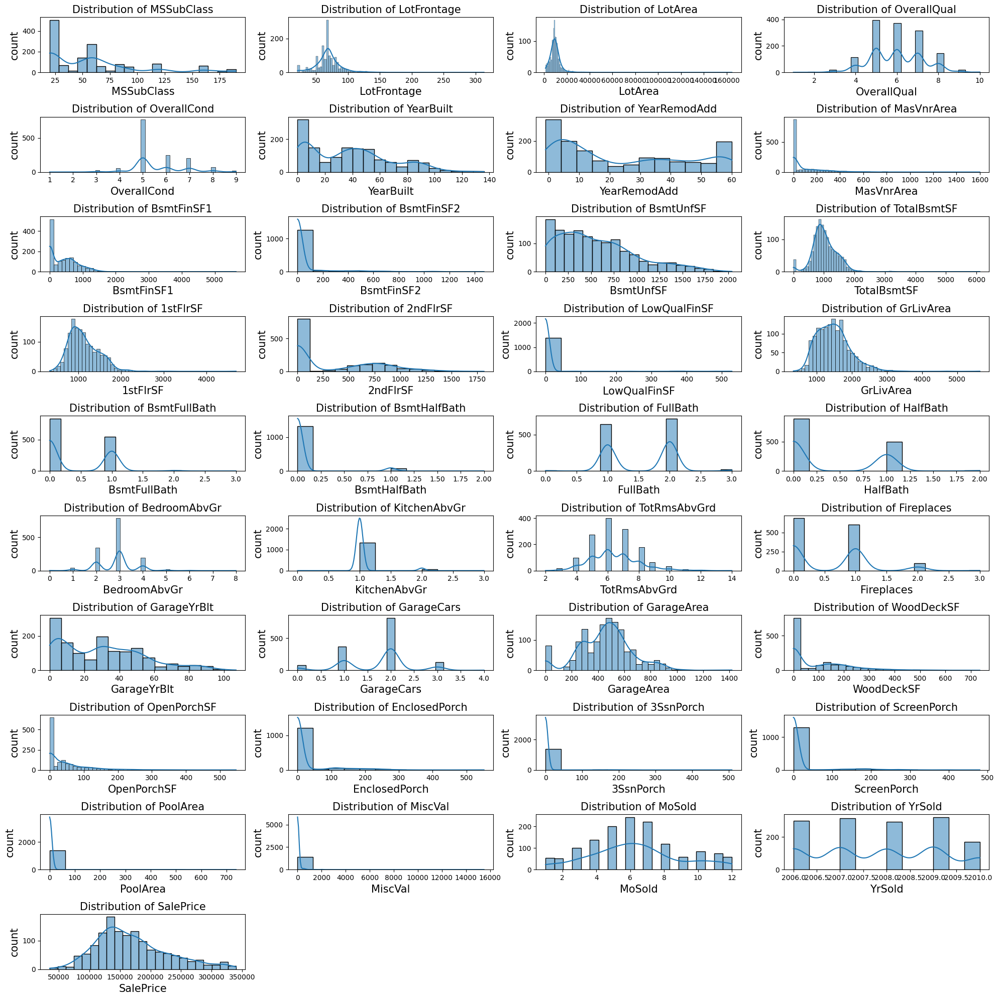

In [55]:
# Histogram of Numerical Columns before Log Transformation
plt.figure(figsize=(20,20)) # To fix the canvas size
plotnumber=1 # initializing plot number
for feature in numerical_features_filtered:
    plt.subplot(10,4,plotnumber) #10*4=40, means we are trying to print 40 subplots 
    sns.histplot(df_filtered[feature],kde=True)
    plt.title(f'Distribution of {feature}',fontsize=15)
    plt.xlabel(feature,fontsize=15)
    plt.ylabel('count',fontsize=15)
    plotnumber+=1
plt.tight_layout() # using tight layout to adjust the shape and do not overlap the figures
plt.show()

**Since Numerical Features are skewed, so we need to apply Log Transformation**

#### Applying Log Transformation on Numerical Features

In [56]:
# Applying Log transformation on Important Numerical features which do not content Nulls
# As we have seen in EDA part
num_features_for_log=['LotFrontage','LotArea','1stFlrSF','GrLivArea','SalePrice']
for feature in num_features_for_log:
    df_filtered[feature]=np.log(df_filtered[feature])

df.head(10)

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60,RL,65.0,8450,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,5,5,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,5.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,0,2,2008,WD,Normal,208500
1,20,RL,80.0,9600,Pave,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,31,31,Gable,CompShg,MetalSd,MetalSd,NaN,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,31.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,0,5,2007,WD,Normal,181500
2,60,RL,68.0,11250,Pave,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,7,6,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,7.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,0,9,2008,WD,Normal,223500
3,70,RL,60.0,9550,Pave,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,91,36,Gable,CompShg,Wd Sdng,Wd Shng,NaN,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,8.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,0,2,2006,WD,Abnorml,140000
4,60,RL,84.0,14260,Pave,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,8,8,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,8.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,0,12,2008,WD,Normal,250000
5,50,RL,85.0,14115,Pave,IR1,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,1.5Fin,5,5,16,14,Gable,CompShg,VinylSd,VinylSd,NaN,0.0,TA,TA,Wood,Gd,TA,No,GLQ,732,Unf,0,64,796,GasA,Ex,Y,SBrkr,796,566,0,1362,1,0,1,1,1,1,TA,5,Typ,0,NaN,Attchd,16.0,Unf,2,480,TA,TA,Y,40,30,0,320,0,0,700,10,2009,WD,Normal,143000
6,20,RL,75.0,10084,Pave,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,1Fam,1Story,8,5,3,2,Gable,CompShg,VinylSd,VinylSd,Stone,186.0,Gd,TA,PConc,Ex,TA,Av,GLQ,1369,Unf,0,317,1686,GasA,Ex,Y,SBrkr,1694,0,0,1694,1,0,2,0,3,1,Gd,7,Typ,1,Gd,Attchd,3.0,RFn,2,636,TA,TA,Y,255,57,0,0,0,0,0,8,2007,WD,Normal,307000
7,60,RL,69.0,10382,Pave,IR1,Lvl,AllPub,Corner,Gtl,NWAmes,PosN,Norm,1Fam,2Story,7,6,36,36,Gable,CompShg,HdBoard,HdBoard,Stone,240.0,TA,TA,CBlock,Gd,TA,Mn,ALQ,859,BLQ,32,216,1107,GasA,Ex,Y,SBrkr,1107,983,0,2090,1,0,2,1,3,1,TA,7,Typ,2,TA,Attchd,36.0,RFn,2,484,TA,TA,Y,235,204,228,0,0,0,350,11,2009,WD,Normal,200000
8,50,RM,51.0,6120,Pave,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Artery,Norm,1Fam,1.5Fin,7,5,77,58,Gable,CompShg,BrkFace,Wd Shng,NaN,0.0,TA,TA,BrkTil,TA,TA,No,Unf,0,Unf,0,952,952,GasA,Gd,Y,FuseF,1022,752,0,1774,0,0,2,0,2,2,TA,8,Min1,2,TA,Detchd,77.0,Unf,2,468,Fa,TA,Y,90,0,205,0,0,0,0,4,2008,WD,Abnorml,129900
9,190,RL,50.0,7420,Pave,Reg,Lvl,AllPub,Corner,Gtl,BrkSide,Artery,Artery,2fmCon,1.5Unf,5,6,69,58,Gable,CompShg,MetalSd,MetalSd,NaN,0.0,TA,TA,BrkTil,TA,TA,No,GLQ,851,Unf,0,140,991,GasA,Ex,Y,SBrkr,1077,0,0,1077,1,0,1,0,2,2,TA,5,Typ,2,TA,Attchd,69.0,RFn,1,205,Gd,TA,Y,0,4,0,0,0,0,0,1,2008,WD,Normal,118000


To visualize the distribution of the newly created 'SalePrice' column and observe the effect of the transformation, I will generate a histogram with a Kernel Density Estimate (KDE). This will allow for a visual assessment of how well the logarithmic transformation normalized the data.


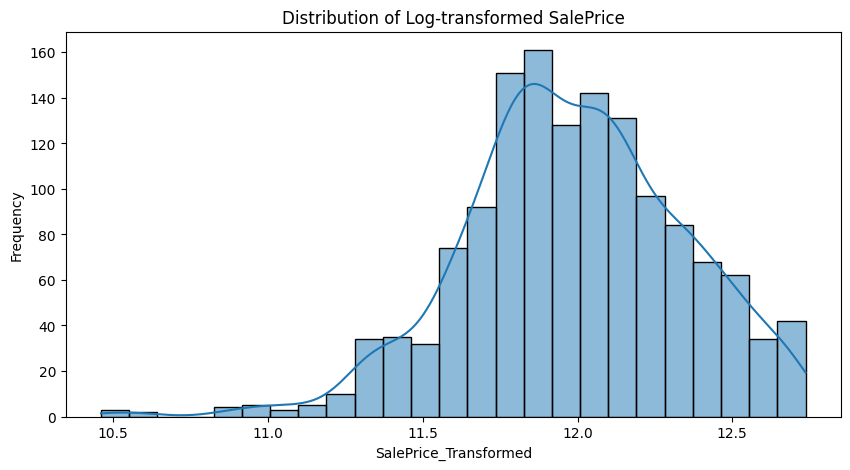

In [57]:
# Visualizing SalePrice after log transformation
plt.figure(figsize=(10, 5))
sns.histplot(df_filtered['SalePrice'], kde=True, bins=25)
plt.title('Distribution of Log-transformed SalePrice')
plt.xlabel('SalePrice_Transformed')
plt.ylabel('Frequency')
plt.show()

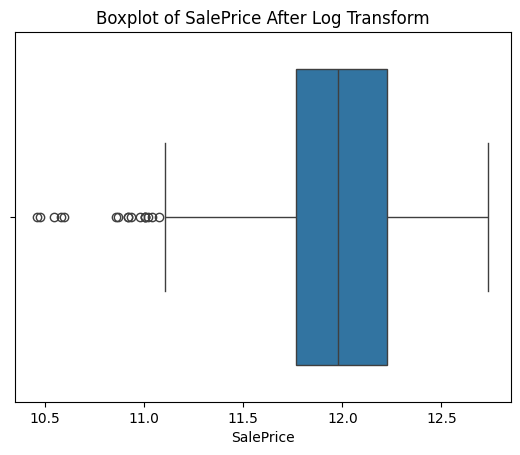

In [58]:
# Boxplot of SalePrice after Log Transformation
sns.boxplot(df_filtered['SalePrice'],orient='h')
plt.title('Boxplot of SalePrice After Log Transform')
plt.show()

In [59]:
# Descriptive Analysis of SalePrice after Log Transformation
skewness=df_filtered['SalePrice'].skew()
kurtosis=df_filtered['SalePrice'].kurt()
print("Descriptive Statistics for SalePrice:\n",df_filtered['SalePrice'].describe().T,'\n')
print(f"Skewness: {skewness:.4f}")
print(f"Kurtosis: {kurtosis:.4f}")

Descriptive Statistics for SalePrice:
 count    1399.000000
mean       11.983928
std         0.355734
min        10.460242
25%        11.767568
50%        11.979799
75%        12.223418
max        12.736701
Name: SalePrice, dtype: float64 

Skewness: -0.3326
Kurtosis: 0.5796


#### Insights of SalePrice Distribution after Log Transformation:
**Skewness:** `-0.5<skewness<0.5` i.e SalePrice distribution is **Fairly Symmetrical** <br>
**Kurtosis:** `kurtosis<3` i.e SalePrice distribution is **Platykurtic**

In [60]:
df_filtered[numerical_features_filtered].head()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
0,60,4.174387,9.041922,7,5,5,5,196.0,706,0,150,856,6.752270,854,0,7.444249,1,0,2,1,3,1,8,0,5.0,2,548,0,61,0,0,0,0,0,2,2008,12.247694
1,20,4.382027,9.169518,6,8,31,31,0.0,978,0,284,1262,7.140453,0,0,7.140453,0,1,2,0,3,1,6,1,31.0,2,460,298,0,0,0,0,0,0,5,2007,12.109011
2,60,4.219508,9.328123,7,5,7,6,162.0,486,0,434,920,6.824374,866,0,7.487734,1,0,2,1,3,1,6,1,7.0,2,608,0,42,0,0,0,0,0,9,2008,12.317167
3,70,4.094345,9.164296,7,5,91,36,0.0,216,0,540,756,6.867974,756,0,7.448334,1,0,1,0,3,1,7,1,8.0,3,642,0,35,272,0,0,0,0,2,2006,11.849398
4,60,4.430817,9.565214,8,5,8,8,350.0,655,0,490,1145,7.043160,1053,0,7.695303,1,0,2,1,4,1,9,1,8.0,3,836,192,84,0,0,0,0,0,12,2008,12.429216


### Categorical Features

#### Categorical Features with Missing Values

In [61]:
# Fetching the Categorical Features with missing/nulls values
categorical_features_filtered_na=[feature for feature in df_filtered.columns if df_filtered[feature].dtype=='O' and df_filtered[feature].isnull().sum()>0]
print('Categorical_Feature_with_missing_values:\n',categorical_features_filtered_na,'\n') 
print('Length of Categorical Features with Missing Values:',len(categorical_features_filtered_na))

Categorical_Feature_with_missing_values:
 ['MasVnrType', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Electrical', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond'] 

Length of Categorical Features with Missing Values: 12


In [62]:
# checking the % of missing values in each categorical features
for feature in categorical_features_filtered_na:
    print('{}: {}% missing values'.format(feature,np.round(df_filtered[feature].isnull().mean()*100,4)))

MasVnrType: 61.544% missing values
BsmtQual: 2.6447% missing values
BsmtCond: 2.6447% missing values
BsmtExposure: 2.7162% missing values
BsmtFinType1: 2.6447% missing values
BsmtFinType2: 2.7162% missing values
Electrical: 0.0715% missing values
FireplaceQu: 49.2495% missing values
GarageType: 5.7898% missing values
GarageFinish: 5.7898% missing values
GarageQual: 5.7898% missing values
GarageCond: 5.7898% missing values


#### Insights:
* Since, we have categorical features with some missing values, we have to replace those missing values with new category(missing)
* Here some Categorical Features`Alley`,`PoolQC`,`Fence`,`MiscFeature` had missing values more than **80%**, so we dropped those features.


In [63]:
df[categorical_features_filtered].head()

,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,FireplaceQu,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,SaleType,SaleCondition
0,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,No,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,NaN,Attchd,RFn,TA,TA,Y,WD,Normal
1,RL,Pave,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,Gable,CompShg,MetalSd,MetalSd,NaN,TA,TA,CBlock,Gd,TA,Gd,ALQ,Unf,GasA,Ex,Y,SBrkr,TA,Typ,TA,Attchd,RFn,TA,TA,Y,WD,Normal
2,RL,Pave,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,Mn,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,TA,Attchd,RFn,TA,TA,Y,WD,Normal
3,RL,Pave,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,Gable,CompShg,Wd Sdng,Wd Shng,NaN,TA,TA,BrkTil,TA,Gd,No,ALQ,Unf,GasA,Gd,Y,SBrkr,Gd,Typ,Gd,Detchd,Unf,TA,TA,Y,WD,Abnorml
4,RL,Pave,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,Av,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,TA,Attchd,RFn,TA,TA,Y,WD,Normal


In [64]:
for feature in categorical_features_filtered:
    print('{}:{}'.format(feature,df_filtered[feature].unique()),'\n')

MSZoning:['RL' 'RM' 'C (all)' 'FV' 'RH'] 

Street:['Pave' 'Grvl'] 

LotShape:['Reg' 'IR1' 'IR2' 'IR3'] 

LandContour:['Lvl' 'Bnk' 'HLS' 'Low'] 

Utilities:['AllPub' 'NoSeWa'] 

LotConfig:['Inside' 'FR2' 'Corner' 'CulDSac' 'FR3'] 

LandSlope:['Gtl' 'Mod' 'Sev'] 

Neighborhood:['CollgCr' 'Veenker' 'Crawfor' 'NoRidge' 'Mitchel' 'Somerst' 'NWAmes'
 'OldTown' 'BrkSide' 'Sawyer' 'NAmes' 'SawyerW' 'NridgHt' 'IDOTRR'
 'MeadowV' 'Edwards' 'Timber' 'Gilbert' 'ClearCr' 'NPkVill' 'StoneBr'
 'Blmngtn' 'BrDale' 'SWISU' 'Blueste'] 

Condition1:['Norm' 'Feedr' 'PosN' 'Artery' 'RRAe' 'RRNn' 'RRAn' 'PosA' 'RRNe'] 

Condition2:['Norm' 'Artery' 'RRNn' 'Feedr' 'PosN' 'PosA' 'RRAn' 'RRAe'] 

BldgType:['1Fam' '2fmCon' 'Duplex' 'TwnhsE' 'Twnhs'] 

HouseStyle:['2Story' '1Story' '1.5Fin' '1.5Unf' 'SFoyer' 'SLvl' '2.5Unf' '2.5Fin'] 

RoofStyle:['Gable' 'Hip' 'Gambrel' 'Mansard' 'Flat' 'Shed'] 

RoofMatl:['CompShg' 'Metal' 'WdShake' 'Membran' 'Tar&Grv' 'WdShngl' 'Roll'
 'ClyTile'] 

Exterior1st:['VinylSd' 'MetalS

In [65]:
for feature in categorical_features_filtered_na:
    print('{}:{}'.format(feature,df_filtered[feature].unique()),'\n')

MasVnrType:['BrkFace' nan 'Stone' 'BrkCmn'] 

BsmtQual:['Gd' 'TA' 'Ex' nan 'Fa'] 

BsmtCond:['TA' 'Gd' nan 'Fa' 'Po'] 

BsmtExposure:['No' 'Gd' 'Mn' 'Av' nan] 

BsmtFinType1:['GLQ' 'ALQ' 'Unf' 'Rec' 'BLQ' nan 'LwQ'] 

BsmtFinType2:['Unf' 'BLQ' nan 'ALQ' 'Rec' 'LwQ' 'GLQ'] 

Electrical:['SBrkr' 'FuseF' 'FuseA' 'FuseP' 'Mix' nan] 

FireplaceQu:[nan 'TA' 'Gd' 'Fa' 'Ex' 'Po'] 

GarageType:['Attchd' 'Detchd' 'CarPort' 'BuiltIn' nan 'Basment' '2Types'] 

GarageFinish:['RFn' 'Unf' 'Fin' nan] 

GarageQual:['TA' 'Fa' 'Gd' nan 'Po' 'Ex'] 

GarageCond:['TA' 'Fa' nan 'Gd' 'Po' 'Ex'] 



In [66]:
# Imputation of Missing values in categorical features
for feature in categorical_features_filtered_na:
    df_filtered[feature]=df_filtered[feature].fillna('missing')

In [67]:
for feature in categorical_features_filtered_na:
    print("{}: {}".format(feature,df_filtered[feature].unique()))

MasVnrType: ['BrkFace' 'missing' 'Stone' 'BrkCmn']
BsmtQual: ['Gd' 'TA' 'Ex' 'missing' 'Fa']
BsmtCond: ['TA' 'Gd' 'missing' 'Fa' 'Po']
BsmtExposure: ['No' 'Gd' 'Mn' 'Av' 'missing']
BsmtFinType1: ['GLQ' 'ALQ' 'Unf' 'Rec' 'BLQ' 'missing' 'LwQ']
BsmtFinType2: ['Unf' 'BLQ' 'missing' 'ALQ' 'Rec' 'LwQ' 'GLQ']
Electrical: ['SBrkr' 'FuseF' 'FuseA' 'FuseP' 'Mix' 'missing']
FireplaceQu: ['missing' 'TA' 'Gd' 'Fa' 'Ex' 'Po']
GarageType: ['Attchd' 'Detchd' 'CarPort' 'BuiltIn' 'missing' 'Basment' '2Types']
GarageFinish: ['RFn' 'Unf' 'Fin' 'missing']
GarageQual: ['TA' 'Fa' 'Gd' 'missing' 'Po' 'Ex']
GarageCond: ['TA' 'Fa' 'missing' 'Gd' 'Po' 'Ex']


In [68]:
df_filtered.head(10)

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60,RL,4.174387,9.041922,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,5,5,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,6.752270,854,0,7.444249,1,0,2,1,3,1,Gd,8,Typ,0,missing,Attchd,5.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,0,2,2008,WD,Normal,12.247694
1,20,RL,4.382027,9.169518,Pave,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,31,31,Gable,CompShg,MetalSd,MetalSd,missing,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,7.140453,0,0,7.140453,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,31.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,0,5,2007,WD,Normal,12.109011
2,60,RL,4.219508,9.328123,Pave,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,7,6,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,6.824374,866,0,7.487734,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,7.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,0,9,2008,WD,Normal,12.317167
3,70,RL,4.094345,9.164296,Pave,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,91,36,Gable,CompShg,Wd Sdng,Wd Shng,missing,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,6.867974,756,0,7.448334,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,8.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,0,2,2006,WD,Abnorml,11.849398
4,60,RL,4.430817,9.565214,Pave,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,8,8,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,7.043160,1053,0,7.695303,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,8.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,0,12,2008,WD,Normal,12.429216
5,50,RL,4.442651,9.554993,Pave,IR1,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,1.5Fin,5,5,16,14,Gable,CompShg,VinylSd,VinylSd,missing,0.0,TA,TA,Wood,Gd,TA,No,GLQ,732,Unf,0,64,796,GasA,Ex,Y,SBrkr,6.679599,566,0,7.216709,1,0,1,1,1,1,TA,5,Typ,0,missing,Attchd,16.0,Unf,2,480,TA,TA,Y,40,30,0,320,0,0,700,10,2009,WD,Normal,11.870600
6,20,RL,4.317488,9.218705,Pave,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,1Fam,1Story,8,5,3,2,Gable,CompShg,VinylSd,VinylSd,Stone,186.0,Gd,TA,PConc,Ex,TA,Av,GLQ,1369,Unf,0,317,1686,GasA,Ex,Y,SBrkr,7.434848,0,0,7.434848,1,0,2,0,3,1,Gd,7,Typ,1,Gd,Attchd,3.0,RFn,2,636,TA,TA,Y,255,57,0,0,0,0,0,8,2007,WD,Normal,12.634603
7,60,RL,4.234107,9.247829,Pave,IR1,Lvl,AllPub,Corner,Gtl,NWAmes,PosN,Norm,1Fam,2Story,7,6,36,36,Gable,CompShg,HdBoard,HdBoard,Stone,240.0,TA,TA,CBlock,Gd,TA,Mn,ALQ,859,BLQ,32,216,1107,GasA,Ex,Y,SBrkr,7.009409,983,0,7.644919,1,0,2,1,3,1,TA,7,Typ,2,TA,Attchd,36.0,RFn,2,484,TA,TA,Y,235,204,228,0,0,0,350,11,2009,WD,Normal,12.206073
8,50,RM,3.931826,8.719317,Pave,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Artery,Norm,1Fam,1.5Fin,7,5,77,58,Gable,CompShg,BrkFace,Wd Shng,missing,0.0,TA,TA,BrkTil,TA,TA,No,Unf,0,Unf,0,952,952,GasA,Gd,Y,FuseF,6.929517,752,0,7.480992,0,0,2,0,2,2,TA,8,Min1,2,TA,Detchd,77.0,Unf,2,468,Fa,TA,Y,90,0,205,0,0,0,0,4,2008,WD,Abnorml,11.774520
9,190,RL,3.912023,8.911934,Pave,Reg,Lvl,AllPub,Corner,Gtl,BrkSide,Artery,Artery,2fmCon,1.5Unf,5,6,69,58,Gable,CompShg,MetalSd,MetalSd,missing,0.0,TA,TA,BrkTil,TA,TA,No,GLQ,851,Unf,0,140,991,GasA,Ex,Y,SBrkr,6.981935,0,0,6.981935,1,0,1,0,2,2,TA,5,Typ,2,TA,Attchd,69.0,RFn

#### Handling Rare Categorical Features
* We will remove categorical features with 1% of observations. 

In [69]:
# Finding the more than 1% of Observations present of each category in each categorical features otherwise they are Rare_variable
for feature in categorical_features_filtered:
    # 1. Calculate percentages
    temp = df_filtered[feature].value_counts(normalize=True)
    
    # 2. Get the list of frequent labels
    temp_df = temp[temp > 0.01].index
    
    # 3. Update the SAME 'data' object
    df_filtered[feature] = np.where(df_filtered[feature].isin(temp_df), df_filtered[feature], 'Rare_variable')

In [70]:
df[categorical_features_filtered].head(10)

,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,FireplaceQu,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,SaleType,SaleCondition
0,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,No,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,NaN,Attchd,RFn,TA,TA,Y,WD,Normal
1,RL,Pave,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,Gable,CompShg,MetalSd,MetalSd,NaN,TA,TA,CBlock,Gd,TA,Gd,ALQ,Unf,GasA,Ex,Y,SBrkr,TA,Typ,TA,Attchd,RFn,TA,TA,Y,WD,Normal
2,RL,Pave,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,Mn,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,TA,Attchd,RFn,TA,TA,Y,WD,Normal
3,RL,Pave,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,Gable,CompShg,Wd Sdng,Wd Shng,NaN,TA,TA,BrkTil,TA,Gd,No,ALQ,Unf,GasA,Gd,Y,SBrkr,Gd,Typ,Gd,Detchd,Unf,TA,TA,Y,WD,Abnorml
4,RL,Pave,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,Av,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,TA,Attchd,RFn,TA,TA,Y,WD,Normal
5,RL,Pave,IR1,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,1.5Fin,Gable,CompShg,VinylSd,VinylSd,NaN,TA,TA,Wood,Gd,TA,No,GLQ,Unf,GasA,Ex,Y,SBrkr,TA,Typ,NaN,Attchd,Unf,TA,TA,Y,WD,Normal
6,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,1Fam,1Story,Gable,CompShg,VinylSd,VinylSd,Stone,Gd,TA,PConc,Ex,TA,Av,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,Gd,Attchd,RFn,TA,TA,Y,WD,Normal
7,RL,Pave,IR1,Lvl,AllPub,Corner,Gtl,NWAmes,PosN,Norm,1Fam,2Story,Gable,CompShg,HdBoard,HdBoard,Stone,TA,TA,CBlock,Gd,TA,Mn,ALQ,BLQ,GasA,Ex,Y,SBrkr,TA,Typ,TA,Attchd,RFn,TA,TA,Y,WD,Normal
8,RM,Pave,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Artery,Norm,1Fam,1.5Fin,Gable,CompShg,BrkFace,Wd Shng,NaN,TA,TA,BrkTil,TA,TA,No,Unf,Unf,GasA,Gd,Y,FuseF,TA,Min1,TA,Detchd,Unf,Fa,TA,Y,WD,Abnorml
9,RL,Pave,Reg,Lvl,AllPub,Corner,Gtl,BrkSide,Artery,Artery,2fmCon,1.5Unf,Gable,CompShg,MetalSd,MetalSd,NaN,TA,TA,BrkTil,TA,TA,No,GLQ,Unf,GasA,Ex,Y,SBrkr,TA,Typ,TA,Attchd,RFn,Gd,TA,Y,WD,Normal


In [71]:
print(len(categorical_features_filtered))

39


In [72]:
# checking all the Categories are present in each Categorical Features
for feature in categorical_features_filtered:
    print('{}'.format(df_filtered[feature].value_counts()))
    print('='*20)

MSZoning
RL               1093
RM                216
FV                 64
RH                 16
Rare_variable      10
Name: count, dtype: int64
Street
Pave             1393
Rare_variable       6
Name: count, dtype: int64
LotShape
Reg              898
IR1              457
IR2               35
Rare_variable      9
Name: count, dtype: int64
LandContour
Lvl    1261
Bnk      63
HLS      41
Low      34
Name: count, dtype: int64
Utilities
AllPub           1398
Rare_variable       1
Name: count, dtype: int64
LotConfig
Inside           1008
Corner            255
CulDSac            86
FR2                46
Rare_variable       4
Name: count, dtype: int64
LandSlope
Gtl              1326
Mod                61
Rare_variable      12
Name: count, dtype: int64
Neighborhood
NAmes            224
CollgCr          148
OldTown          112
Edwards          100
Somerst           84
Gilbert           78
Sawyer            74
NWAmes            73
SawyerW           59
BrkSide           58
NridgHt           50
M

In [73]:
df_filtered.head(14)

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60,RL,4.174387,9.041922,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,5,5,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,6.752270,854,0,7.444249,1,0,2,1,3,1,Gd,8,Typ,0,missing,Attchd,5.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,0,2,2008,WD,Normal,12.247694
1,20,RL,4.382027,9.169518,Pave,Reg,Lvl,AllPub,FR2,Gtl,Rare_variable,Feedr,Norm,1Fam,1Story,6,8,31,31,Gable,CompShg,MetalSd,MetalSd,missing,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,7.140453,0,0,7.140453,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,31.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,0,5,2007,WD,Normal,12.109011
2,60,RL,4.219508,9.328123,Pave,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,7,6,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,6.824374,866,0,7.487734,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,7.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,0,9,2008,WD,Normal,12.317167
3,70,RL,4.094345,9.164296,Pave,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,91,36,Gable,CompShg,Wd Sdng,Wd Shng,missing,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,6.867974,756,0,7.448334,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,8.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,0,2,2006,WD,Abnorml,11.849398
4,60,RL,4.430817,9.565214,Pave,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,8,8,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,7.043160,1053,0,7.695303,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,8.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,0,12,2008,WD,Normal,12.429216
5,50,RL,4.442651,9.554993,Pave,IR1,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,1.5Fin,5,5,16,14,Gable,CompShg,VinylSd,VinylSd,missing,0.0,TA,TA,Rare_variable,Gd,TA,No,GLQ,732,Unf,0,64,796,GasA,Ex,Y,SBrkr,6.679599,566,0,7.216709,1,0,1,1,1,1,TA,5,Typ,0,missing,Attchd,16.0,Unf,2,480,TA,TA,Y,40,30,0,320,0,0,700,10,2009,WD,Normal,11.870600
6,20,RL,4.317488,9.218705,Pave,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,1Fam,1Story,8,5,3,2,Gable,CompShg,VinylSd,VinylSd,Stone,186.0,Gd,TA,PConc,Ex,TA,Av,GLQ,1369,Unf,0,317,1686,GasA,Ex,Y,SBrkr,7.434848,0,0,7.434848,1,0,2,0,3,1,Gd,7,Typ,1,Gd,Attchd,3.0,RFn,2,636,TA,TA,Y,255,57,0,0,0,0,0,8,2007,WD,Normal,12.634603
7,60,RL,4.234107,9.247829,Pave,IR1,Lvl,AllPub,Corner,Gtl,NWAmes,PosN,Norm,1Fam,2Story,7,6,36,36,Gable,CompShg,HdBoard,HdBoard,Stone,240.0,TA,TA,CBlock,Gd,TA,Mn,ALQ,859,BLQ,32,216,1107,GasA,Ex,Y,SBrkr,7.009409,983,0,7.644919,1,0,2,1,3,1,TA,7,Typ,2,TA,Attchd,36.0,RFn,2,484,TA,TA,Y,235,204,228,0,0,0,350,11,2009,WD,Normal,12.206073
8,50,RM,3.931826,8.719317,Pave,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Artery,Norm,1Fam,1.5Fin,7,5,77,58,Gable,CompShg,BrkFace,Wd Shng,missing,0.0,TA,TA,BrkTil,TA,TA,No,Unf,0,Unf,0,952,952,GasA,Gd,Y,FuseF,6.929517,752,0,7.480992,0,0,2,0,2,2,TA,8,Min1,2,TA,Detchd,77.0,Unf,2,468,Fa,TA,Y,90,0,205,0,0,0,0,4,2008,WD,Abnorml,11.774520
9,190,RL,3.912023,8.911934,Pave,Reg,Lvl,AllPub,Corner,Gtl,BrkSide,Artery,Rare_variable,2fmCon,1.5Unf,5,6,69,58,Gable,CompShg,MetalSd,MetalSd,missing,0.0,TA,TA,BrkTil,TA,TA,No,GLQ,851,Unf,0,140,991,GasA,Ex,Y,SBrkr,6.981935,0,0,6.981935,1,0,1,0,2,2,TA,5,Ty

### Encoding Categorical Features 

In [74]:
len(categorical_features_filtered)

39

In [75]:
# Nominal Categorical Features
nominal_categorical_features = [
    'MSZoning', 'Street', 'LotConfig', 'Neighborhood', 
    'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 
    'RoofMatl', 'Utilities', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 
    'Foundation', 'Heating', 'CentralAir', 'Electrical', 'GarageType', 
     'SaleType', 'SaleCondition'
]
print(len(nominal_categorical_features))

21


In [76]:
# Ordinal Categorical Features
ordinal_categorical_features = [
    'LotShape', 'LandSlope', 'LandContour', 'ExterQual', 'ExterCond', 
    'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 
    'HeatingQC', 'KitchenQual', 'Functional', 'FireplaceQu', 'GarageFinish', 
    'GarageQual', 'GarageCond', 'PavedDrive'
]
print(len(ordinal_categorical_features))

18


In [77]:
# Binary Categorical Features-OHE
binary_cat_features=[feature for feature in categorical_features_filtered if df_filtered[feature].nunique()==2]
print("Binary Categorical Fetures:",binary_cat_features,'\n')

for feature in binary_cat_features:
    print('Values of {}: {}'.format(feature,df_filtered[feature].unique()))

Binary Categorical Fetures: ['Street', 'Utilities', 'Condition2', 'RoofMatl', 'CentralAir'] 

Values of Street: ['Pave' 'Rare_variable']
Values of Utilities: ['AllPub' 'Rare_variable']
Values of Condition2: ['Norm' 'Rare_variable']
Values of RoofMatl: ['CompShg' 'Rare_variable']
Values of CentralAir: ['Y' 'N']


In [78]:
# Ordinal Ctegorical Features
ordinal_cat_features=[feature for feature in ordinal_categorical_features if feature not in binary_cat_features]
print("Ordinal Categorical Fetures",ordinal_cat_features,'\n')
print("Length of Ordinal Categorical Fetures:",len(ordinal_cat_features))

Ordinal Categorical Fetures ['LotShape', 'LandSlope', 'LandContour', 'ExterQual', 'ExterCond', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'HeatingQC', 'KitchenQual', 'Functional', 'FireplaceQu', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive'] 

Length of Ordinal Categorical Fetures: 18


In [79]:
# Nominal Ctegorical Features-Label
nominal_cat_features=[feature for feature in nominal_categorical_features if feature not in binary_cat_features]
print("Nominal Categorical Fetures",nominal_cat_features,'\n')
print("Length of Nominal Categorical Fetures:",len(nominal_cat_features))

Nominal Categorical Fetures ['MSZoning', 'LotConfig', 'Neighborhood', 'Condition1', 'BldgType', 'HouseStyle', 'RoofStyle', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'Foundation', 'Heating', 'Electrical', 'GarageType', 'SaleType', 'SaleCondition'] 

Length of Nominal Categorical Fetures: 16


In [80]:
# Importing Encoders Libraries 
from sklearn.preprocessing import OneHotEncoder,LabelEncoder,OrdinalEncoder

In [81]:
# OneHotEncoding for Binary Categorical Columns
# Here df_filtered now stored to df_encoded
df_encoded = pd.get_dummies(df_filtered, columns=binary_cat_features, drop_first=True)
df_encoded.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,Street_Rare_variable,Utilities_Rare_variable,Condition2_Rare_variable,RoofMatl_Rare_variable,CentralAir_Y
0,60,RL,4.174387,9.041922,Reg,Lvl,Inside,Gtl,CollgCr,Norm,1Fam,2Story,7,5,5,5,Gable,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,SBrkr,6.752270,854,0,7.444249,1,0,2,1,3,1,Gd,8,Typ,0,missing,Attchd,5.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,0,2,2008,WD,Normal,12.247694,False,False,False,False,True
1,20,RL,4.382027,9.169518,Reg,Lvl,FR2,Gtl,Rare_variable,Feedr,1Fam,1Story,6,8,31,31,Gable,MetalSd,MetalSd,missing,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,SBrkr,7.140453,0,0,7.140453,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,31.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,0,5,2007,WD,Normal,12.109011,False,False,False,False,True
2,60,RL,4.219508,9.328123,IR1,Lvl,Inside,Gtl,CollgCr,Norm,1Fam,2Story,7,5,7,6,Gable,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,SBrkr,6.824374,866,0,7.487734,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,7.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,0,9,2008,WD,Normal,12.317167,False,False,False,False,True
3,70,RL,4.094345,9.164296,IR1,Lvl,Corner,Gtl,Crawfor,Norm,1Fam,2Story,7,5,91,36,Gable,Wd Sdng,Wd Shng,missing,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,SBrkr,6.867974,756,0,7.448334,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,8.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,0,2,2006,WD,Abnorml,11.849398,False,False,False,False,True
4,60,RL,4.430817,9.565214,IR1,Lvl,FR2,Gtl,NoRidge,Norm,1Fam,2Story,8,5,8,8,Gable,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,SBrkr,7.043160,1053,0,7.695303,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,8.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,0,12,2008,WD,Normal,12.429216,False,False,False,False,True


In [82]:
binary_cat_encoded_features=['Street_Rare_variable','Utilities_Rare_variable','Condition2_Rare_variable','RoofMatl_Rare_variable','CentralAir_Y']

In [83]:
for feature in binary_cat_encoded_features:
    print("{}: {}".format(feature,df_encoded[feature].unique()))

Street_Rare_variable: [False  True]
Utilities_Rare_variable: [False  True]
Condition2_Rare_variable: [False  True]
RoofMatl_Rare_variable: [False  True]
CentralAir_Y: [ True False]


In [84]:
# Label Encoding for Nominal Ctegorical Features
ladel_encoder = LabelEncoder()
for feature in nominal_cat_features:
    df_encoded[feature]=ladel_encoder.fit_transform(df_encoded[feature])

In [85]:
df_encoded.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,Street_Rare_variable,Utilities_Rare_variable,Condition2_Rare_variable,RoofMatl_Rare_variable,CentralAir_Y
0,60,2,4.174387,9.041922,Reg,Lvl,3,Gtl,4,2,0,3,7,5,5,5,0,8,8,1,196.0,Gd,TA,2,Gd,TA,No,GLQ,706,Unf,0,150,856,0,Ex,3,6.752270,854,0,7.444249,1,0,2,1,3,1,Gd,8,Typ,0,missing,0,5.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,0,2,2008,3,2,12.247694,False,False,False,False,True
1,20,2,4.382027,9.169518,Reg,Lvl,2,Gtl,16,1,0,2,6,8,31,31,0,4,4,3,0.0,TA,TA,1,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,0,Ex,3,7.140453,0,0,7.140453,0,1,2,0,3,1,TA,6,Typ,1,TA,0,31.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,0,5,2007,3,2,12.109011,False,False,False,False,True
2,60,2,4.219508,9.328123,IR1,Lvl,3,Gtl,4,2,0,3,7,5,7,6,0,8,8,1,162.0,Gd,TA,2,Gd,TA,Mn,GLQ,486,Unf,0,434,920,0,Ex,3,6.824374,866,0,7.487734,1,0,2,1,3,1,Gd,6,Typ,1,TA,0,7.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,0,9,2008,3,2,12.317167,False,False,False,False,True
3,70,2,4.094345,9.164296,IR1,Lvl,0,Gtl,5,2,0,3,7,5,91,36,0,9,10,3,0.0,TA,TA,0,TA,Gd,No,ALQ,216,Unf,0,540,756,0,Gd,3,6.867974,756,0,7.448334,1,0,1,0,3,1,Gd,7,Typ,1,Gd,3,8.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,0,2,2006,3,0,11.849398,False,False,False,False,True
4,60,2,4.430817,9.565214,IR1,Lvl,2,Gtl,13,2,0,3,8,5,8,8,0,8,8,1,350.0,Gd,TA,2,Gd,TA,Av,GLQ,655,Unf,0,490,1145,0,Ex,3,7.043160,1053,0,7.695303,1,0,2,1,4,1,Gd,9,Typ,1,TA,0,8.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,0,12,2008,3,2,12.429216,False,False,False,False,True


In [86]:
for feature in nominal_cat_features:
    print("{}: {}".format(feature,df_encoded[feature].unique()))

MSZoning: [2 3 4 0 1]
LotConfig: [3 2 0 1 4]
Neighborhood: [ 4 16  5 13 10 20 12 15  2 18 11 19 14  8  9  6 22  7  3 21  0  1 17]
Condition1: [2 1 3 0 5 4]
BldgType: [0 1 2 4 3]
HouseStyle: [3 2 0 1 5 6 4]
RoofStyle: [0 1 2]
Exterior1st: [ 8  4  9  3  1  2  5  0  7 10  6]
Exterior2nd: [ 8  4 10  3  5  9  2  1  7  0  6]
MasVnrType: [1 3 2 0]
Foundation: [2 1 0 3 4]
Heating: [0 1 2]
Electrical: [3 1 0 2]
GarageType: [0 3 4 2 5 1]
SaleType: [3 1 0 2]
SaleCondition: [2 0 3 4 1]


In [87]:
df_encoded.head()


,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,Street_Rare_variable,Utilities_Rare_variable,Condition2_Rare_variable,RoofMatl_Rare_variable,CentralAir_Y
0,60,2,4.174387,9.041922,Reg,Lvl,3,Gtl,4,2,0,3,7,5,5,5,0,8,8,1,196.0,Gd,TA,2,Gd,TA,No,GLQ,706,Unf,0,150,856,0,Ex,3,6.752270,854,0,7.444249,1,0,2,1,3,1,Gd,8,Typ,0,missing,0,5.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,0,2,2008,3,2,12.247694,False,False,False,False,True
1,20,2,4.382027,9.169518,Reg,Lvl,2,Gtl,16,1,0,2,6,8,31,31,0,4,4,3,0.0,TA,TA,1,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,0,Ex,3,7.140453,0,0,7.140453,0,1,2,0,3,1,TA,6,Typ,1,TA,0,31.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,0,5,2007,3,2,12.109011,False,False,False,False,True
2,60,2,4.219508,9.328123,IR1,Lvl,3,Gtl,4,2,0,3,7,5,7,6,0,8,8,1,162.0,Gd,TA,2,Gd,TA,Mn,GLQ,486,Unf,0,434,920,0,Ex,3,6.824374,866,0,7.487734,1,0,2,1,3,1,Gd,6,Typ,1,TA,0,7.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,0,9,2008,3,2,12.317167,False,False,False,False,True
3,70,2,4.094345,9.164296,IR1,Lvl,0,Gtl,5,2,0,3,7,5,91,36,0,9,10,3,0.0,TA,TA,0,TA,Gd,No,ALQ,216,Unf,0,540,756,0,Gd,3,6.867974,756,0,7.448334,1,0,1,0,3,1,Gd,7,Typ,1,Gd,3,8.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,0,2,2006,3,0,11.849398,False,False,False,False,True
4,60,2,4.430817,9.565214,IR1,Lvl,2,Gtl,13,2,0,3,8,5,8,8,0,8,8,1,350.0,Gd,TA,2,Gd,TA,Av,GLQ,655,Unf,0,490,1145,0,Ex,3,7.043160,1053,0,7.695303,1,0,2,1,4,1,Gd,9,Typ,1,TA,0,8.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,0,12,2008,3,2,12.429216,False,False,False,False,True


In [88]:
# Ordinal Categorical Features
for feature in ordinal_cat_features:
    print('{}: {}'.format(feature,df_encoded[feature].unique()))

LotShape: ['Reg' 'IR1' 'IR2' 'Rare_variable']
LandSlope: ['Gtl' 'Mod' 'Rare_variable']
LandContour: ['Lvl' 'Bnk' 'HLS' 'Low']
ExterQual: ['Gd' 'TA' 'Ex' 'Fa']
ExterCond: ['TA' 'Gd' 'Fa' 'Rare_variable']
BsmtQual: ['Gd' 'TA' 'Ex' 'missing' 'Fa']
BsmtCond: ['TA' 'Gd' 'missing' 'Fa' 'Rare_variable']
BsmtExposure: ['No' 'Gd' 'Mn' 'Av' 'missing']
BsmtFinType1: ['GLQ' 'ALQ' 'Unf' 'Rec' 'BLQ' 'missing' 'LwQ']
BsmtFinType2: ['Unf' 'BLQ' 'missing' 'ALQ' 'Rec' 'LwQ' 'GLQ']
HeatingQC: ['Ex' 'Gd' 'TA' 'Fa' 'Rare_variable']
KitchenQual: ['Gd' 'TA' 'Fa' 'Ex']
Functional: ['Typ' 'Min1' 'Maj1' 'Min2' 'Mod' 'Rare_variable']
FireplaceQu: ['missing' 'TA' 'Gd' 'Fa' 'Ex' 'Po']
GarageFinish: ['RFn' 'Unf' 'Fin' 'missing']
GarageQual: ['TA' 'Fa' 'Gd' 'missing' 'Rare_variable']
GarageCond: ['TA' 'Fa' 'missing' 'Rare_variable']
PavedDrive: ['Y' 'N' 'P']


In [89]:
# Ordinal Encoding for Ordinal Cateorical Columns by SciKit_learn 
# 1. Defining Ordinal Columns to Encode
#ordinal_quality_cond_cat_features=['ExterQual', 'ExterCond', 'BsmtQual', 'BsmtCond', 'HeatingQC', 'KitchenQual', 'FireplaceQu', 'GarageQual', 'GarageCond']

#2. Define the category order (lowest to highest)
#ord_cat_val =['missing','Rare_variable', 'Po', 'Fa', 'TA', 'Gd', 'Ex']

# 4. Apply the encoding
#for feature in ordinal_quality_cond_cat_features:   
    # Initialize encoder with your specific categories
   # ordinal_enc = OrdinalEncoder(categories=[ord_cat_val])
    
    # Transform and assign back to the dataframe
   # df_encoded[feature] = ordinal_enc.fit_transform(df_encoded[[feature]])



In [90]:
# Ordinal Encoding for Ordinal Cateorical Columns using Manual Mapping
def ordinal_features_encoding(df_encoded):
     # 1. Defining the Mappings
    qual_cond_map = {'Ex': 5, 'Gd': 4, 'TA': 3, 'Fa': 2, 'Po': 1, 'Rare_variable': 0, 'missing': -1}
    
    mapping_config = {
        'ExterQual': qual_cond_map,
        'ExterCond': qual_cond_map,
        'BsmtQual': qual_cond_map,
        'BsmtCond': qual_cond_map,
        'HeatingQC': qual_cond_map,
        'KitchenQual': qual_cond_map,
        'FireplaceQu': qual_cond_map,
        'GarageQual': qual_cond_map,
        'GarageCond': qual_cond_map,
        'LotShape': {'Reg': 3, 'IR1': 2, 'IR2': 1, 'Rare_variable': 0},
        'LandSlope': {'Rare_variable': 2, 'Mod': 1, 'Gtl': 0},
        'LandContour': {'Low': 3, 'HLS': 2, 'Bnk': 1, 'Lvl': 0},
        'BsmtExposure': {'Gd': 3, 'Av': 2, 'Mn': 1, 'No': 0, 'missing': -1},
        'BsmtFinType1': {'GLQ': 5, 'ALQ': 4, 'BLQ': 3, 'Rec': 2, 'LwQ': 1, 'Unf': 0, 'missing': -1},
        'BsmtFinType2': {'GLQ': 5, 'ALQ': 4, 'BLQ': 3, 'Rec': 2, 'LwQ': 1, 'Unf': 0, 'missing': -1},
        'GarageFinish': {'Fin': 2, 'RFn': 1, 'Unf': 0, 'missing': -1},
        'Functional': {'Typ': 5, 'Min1': 4, 'Min2': 3, 'Mod': 2, 'Maj1': 1, 'Rare_variable': 0},
        'PavedDrive': {'Y': 2, 'P': 1, 'N': 0}
    }

    # 2. Apply mapping using a loop
    for col, mapper in mapping_config.items():
        if col in df_encoded.columns:
            # We use .map() but keep original value if not found to avoid unintended NaNs
            df_encoded[col] = df_encoded[col].map(mapper)#.fillna(-1)
    return df_encoded

# 2. calling the ordinal encoding function
df_encoded = ordinal_features_encoding(df_encoded)  

In [92]:
# 3. Verify the ordinal categorical features encoding
df_encoded[ordinal_cat_features].head()

,LotShape,LandSlope,LandContour,ExterQual,ExterCond,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,HeatingQC,KitchenQual,Functional,FireplaceQu,GarageFinish,GarageQual,GarageCond,PavedDrive
0,3,0,0,4,3,4,3,0,5,0,5,4,5,-1,1,3,3,2
1,3,0,0,3,3,4,3,3,4,0,5,3,5,3,1,3,3,2
2,2,0,0,4,3,4,3,1,5,0,5,4,5,3,1,3,3,2
3,2,0,0,3,3,3,4,0,4,0,4,4,5,4,0,3,3,2
4,2,0,0,4,3,4,3,2,5,0,5,4,5,3,1,3,3,2


In [91]:
# Verify the complete encoding in DataFrame
df_encoded.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,Street_Rare_variable,Utilities_Rare_variable,Condition2_Rare_variable,RoofMatl_Rare_variable,CentralAir_Y
0,60,2,4.174387,9.041922,3,0,3,0,4,2,0,3,7,5,5,5,0,8,8,1,196.0,4,3,2,4,3,0,5,706,0,0,150,856,0,5,3,6.752270,854,0,7.444249,1,0,2,1,3,1,4,8,5,0,-1,0,5.0,1,2,548,3,3,2,0,61,0,0,0,0,0,2,2008,3,2,12.247694,False,False,False,False,True
1,20,2,4.382027,9.169518,3,0,2,0,16,1,0,2,6,8,31,31,0,4,4,3,0.0,3,3,1,4,3,3,4,978,0,0,284,1262,0,5,3,7.140453,0,0,7.140453,0,1,2,0,3,1,3,6,5,1,3,0,31.0,1,2,460,3,3,2,298,0,0,0,0,0,0,5,2007,3,2,12.109011,False,False,False,False,True
2,60,2,4.219508,9.328123,2,0,3,0,4,2,0,3,7,5,7,6,0,8,8,1,162.0,4,3,2,4,3,1,5,486,0,0,434,920,0,5,3,6.824374,866,0,7.487734,1,0,2,1,3,1,4,6,5,1,3,0,7.0,1,2,608,3,3,2,0,42,0,0,0,0,0,9,2008,3,2,12.317167,False,False,False,False,True
3,70,2,4.094345,9.164296,2,0,0,0,5,2,0,3,7,5,91,36,0,9,10,3,0.0,3,3,0,3,4,0,4,216,0,0,540,756,0,4,3,6.867974,756,0,7.448334,1,0,1,0,3,1,4,7,5,1,4,3,8.0,0,3,642,3,3,2,0,35,272,0,0,0,0,2,2006,3,0,11.849398,False,False,False,False,True
4,60,2,4.430817,9.565214,2,0,2,0,13,2,0,3,8,5,8,8,0,8,8,1,350.0,4,3,2,4,3,2,5,655,0,0,490,1145,0,5,3,7.043160,1053,0,7.695303,1,0,2,1,4,1,4,9,5,1,3,0,8.0,1,3,836,3,3,2,192,84,0,0,0,0,0,12,2008,3,2,12.429216,False,False,False,False,True


In [93]:
for feature in ordinal_cat_features:
    print('{}: {}'.format(feature,df_encoded[feature].unique()),'\n')

LotShape: [3 2 1 0] 

LandSlope: [0 1 2] 

LandContour: [0 1 2 3] 

ExterQual: [4 3 5 2] 

ExterCond: [3 4 2 0] 

BsmtQual: [ 4  3  5 -1  2] 

BsmtCond: [ 3  4 -1  2  0] 

BsmtExposure: [ 0  3  1  2 -1] 

BsmtFinType1: [ 5  4  0  2  3 -1  1] 

BsmtFinType2: [ 0  3 -1  4  2  1  5] 

HeatingQC: [5 4 3 2 0] 

KitchenQual: [4 3 2 5] 

Functional: [5 4 1 3 2 0] 

FireplaceQu: [-1  3  4  2  5  1] 

GarageFinish: [ 1  0  2 -1] 

GarageQual: [ 3  2  4 -1  0] 

GarageCond: [ 3  2 -1  0] 

PavedDrive: [2 0 1] 



In [94]:
# Checking result
df_encoded.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,Street_Rare_variable,Utilities_Rare_variable,Condition2_Rare_variable,RoofMatl_Rare_variable,CentralAir_Y
0,60,2,4.174387,9.041922,3,0,3,0,4,2,0,3,7,5,5,5,0,8,8,1,196.0,4,3,2,4,3,0,5,706,0,0,150,856,0,5,3,6.752270,854,0,7.444249,1,0,2,1,3,1,4,8,5,0,-1,0,5.0,1,2,548,3,3,2,0,61,0,0,0,0,0,2,2008,3,2,12.247694,False,False,False,False,True
1,20,2,4.382027,9.169518,3,0,2,0,16,1,0,2,6,8,31,31,0,4,4,3,0.0,3,3,1,4,3,3,4,978,0,0,284,1262,0,5,3,7.140453,0,0,7.140453,0,1,2,0,3,1,3,6,5,1,3,0,31.0,1,2,460,3,3,2,298,0,0,0,0,0,0,5,2007,3,2,12.109011,False,False,False,False,True
2,60,2,4.219508,9.328123,2,0,3,0,4,2,0,3,7,5,7,6,0,8,8,1,162.0,4,3,2,4,3,1,5,486,0,0,434,920,0,5,3,6.824374,866,0,7.487734,1,0,2,1,3,1,4,6,5,1,3,0,7.0,1,2,608,3,3,2,0,42,0,0,0,0,0,9,2008,3,2,12.317167,False,False,False,False,True
3,70,2,4.094345,9.164296,2,0,0,0,5,2,0,3,7,5,91,36,0,9,10,3,0.0,3,3,0,3,4,0,4,216,0,0,540,756,0,4,3,6.867974,756,0,7.448334,1,0,1,0,3,1,4,7,5,1,4,3,8.0,0,3,642,3,3,2,0,35,272,0,0,0,0,2,2006,3,0,11.849398,False,False,False,False,True
4,60,2,4.430817,9.565214,2,0,2,0,13,2,0,3,8,5,8,8,0,8,8,1,350.0,4,3,2,4,3,2,5,655,0,0,490,1145,0,5,3,7.043160,1053,0,7.695303,1,0,2,1,4,1,4,9,5,1,3,0,8.0,1,3,836,3,3,2,192,84,0,0,0,0,0,12,2008,3,2,12.429216,False,False,False,False,True


In [95]:
df_encoded.shape

(1399, 76)

## 6.Feature Selection 

In [96]:
# Feature Selection using correlation matrix
df_correlation= df_encoded.corr()
df_correlation

,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,Street_Rare_variable,Utilities_Rare_variable,Condition2_Rare_variable,RoofMatl_Rare_variable,CentralAir_Y
MSSubClass,1.000000,0.031347,-0.483206,-0.470304,0.115339,-0.018625,0.085009,-0.029828,0.028392,-0.027290,0.747625,0.301741,0.066951,-0.070420,-0.046431,-0.056430,-0.108013,-0.104099,-0.120517,-0.034788,0.046949,0.045058,-0.061357,0.068876,0.066100,-0.012418,0.080375,0.040391,-0.050465,-0.024693,-0.066088,-0.137873,-0.224965,0.041223,-0.008743,0.058445,-0.280021,0.312578,0.043961,0.103430,0.017438,-0.010330,0.148676,0.182521,-0.036175,0.281714,0.011140,0.056035,-0.003244,-0.033322,-0.021300,0.141060,-0.100932,-0.017428,-0.018590,-0.081461,-0.070128,-0.079947,-0.056519,0.000562,0.000916,-0.014835,-0.047040,-0.034634,0.007317,-0.008994,-0.016176,-0.020555,0.031037,-0.002786,-0.049203,0.024305,-0.023432,0.048702,-0.031820,-0.099182
MSZoning,0.031347,1.000000,-0.138889,-0.104039,0.103078,0.035134,-0.008428,0.023240,-0.306081,-0.058155,-0.018171,-0.125485,-0.277072,0.144067,0.418150,0.259097,0.028429,-0.028201,-0.015690,0.065042,-0.104823,-0.293738,0.031971,-0.267998,-0.187758,-0.044468,-0.017892,-0.139535,-0.077939,0.028269,0.012703,-0.052487,-0.132324,0.088178,-0.217248,-0.142833,-0.117629,-0.067188,0.055237,-0.160014,-0.051727,0.012667,-0.276128,-0.173235,-0.061444,0.065220,-0.240289,-0.067703,-0.083821,-0.056812,-0.069188,0.208606,0.320410,-0.216658,-0.204518,-0.220823,-0.127866,-0.126296,-0.203880,-0.044829,-0.150612,0.180934,-0.012185,0.007540,-0.006983,0.011487,-0.002484,0.002268,0.114829,-0.107839,-0.366821,0.082473,-0.002879,0.083234,-0.013919,-0.175607
LotFrontage,-0.483206,-0.138889,1.000000,0.665354,-0.168617,0.079090,-0.192916,0.059760,0.066024,0.010736,-0.538874,0.007707,0.154280,-0.017088,-0.059500,-0.032579,0.139919,0.111397,0.118483,-0.075663,0.094666,0.102711,-0.006257,0.062652,0.053782,0.017928,0.092637,0.036402,0.143832,0.010164,0.037972,0.126619,0.300128,-0.013707,0.064872,0.026644,0.404962,0.024305,0.022479,0.291670,0.050237,0.001825,0.131393,-0.002968,0.274555,0.021581,0.099167,0.297057,0.021816,0.201598,0.198382,-0.249724,-0.008305,0.192911,0.240024,0.291577,0.113193,0.107795,0.070506,0.074474,0.103563,0.021000,0.064166,0.051222,0.092401,0.014609,0.023398,0.007947,-0.039501,0.043988,0.313411,0.037556,0.003888,0.017672,0.097945,0.045482
LotArea,-0.470304,-0.104039,0.665354,1.000000,-0.334259,0.220418,-0.185916,0.242426,0.039481,0.064710,-0.575034,-0.032580,0.115970,0.002701,0.005711,-0.002252,0.175752,0.099561,0.074286,-0.024550,0.061376,0.049043,0.028087,-0.005520,0.029527,0.012118,0.173255,0.017466,0.194625,0.056210,0.082118,0.074196,0.315926,-0.011288,0.026093,0.017045,0.445097,0.054838,0.003200,0.352062,0.108055,0.055699,0.150380,0.014650,0.291147,0.010818,0.067871,0.332576,-0.021192,0.304441,0.249151,-0.230096,0.053661,0.161394,0.232910,0.290182,0.139351,0.129081,0.011915,0.165484,0.134848,0.021129,0.064550,0.091054,0.094213,0.053627,0.012731,-0.027343,-0.004800,0.041455,0.359937,0.113068,0.025540,0.033801,0.190327,0.048946
LotShape,0.115339,0.103078,-0.168617,-0.334259,1.000000,-0.186149,0.218345,-0.125286,0.015513,-0.126514,0.112209,-0.092163,-0.185157,0.038519,0.235964,0.176558,-0.005454,-0.034332,-0.023081,0.030179,-0.062868,-0.182667,-0

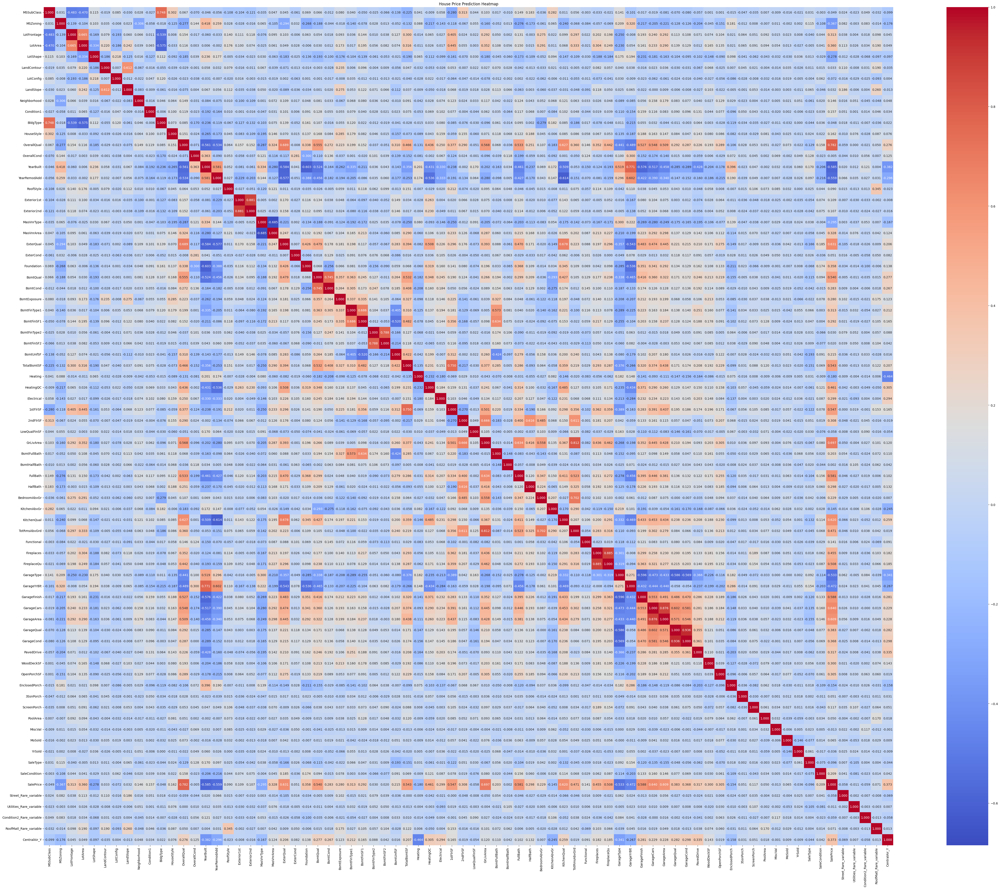

In [97]:
# Heatmap for Feature Selection and drop multicollinearity 
plt.figure(figsize=(50,40))
sns.heatmap(df_correlation,annot=True,cmap='coolwarm',fmt=".3f")
plt.tight_layout()
plt.title('House Price Prediction Heatmap')
#plt.savefig('C:/Datamites_DataScience_Course/Datamites Internship/House Price Prediction-Advance Regression/my_heatmap.png', bbox_inches='tight')
plt.show()

In [98]:
# Dropping Multicollinearity from Dataset
# Calculate correlation matrix and make negative correlation as positive using abs() function 
corr_matrix = df_encoded.corr().abs()

# Select the upper triangle of the correlation matrix (to avoid duplicates)
# k=1 excludes the diagonal (self-correlation)
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))

# Find features with correlation greater than a threshold(Eg.0.8)
to_drop = [feature for feature in upper.columns if any(upper[feature] > 0.8)]

# Drop the identified features
df_dropped = df_encoded.drop(columns=to_drop, axis=1)

In [99]:
print("Original features:", df_encoded.columns.tolist(),'\n')
print("Features to drop:", to_drop,'\n')
print("Remaining features:", df_dropped.columns.tolist(),'\n')

Original features: ['MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'LotShape', 'LandContour', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'BldgType', 'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'RoofStyle', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1', 'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating', 'HeatingQC', 'Electrical', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual', 'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType', 'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual', 'GarageCond', 'PavedDrive', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal', 'MoSold', 'YrSold', 'SaleType', 'SaleCondition', 'SalePr

In [100]:
df_encoded.shape

(1399, 76)

In [101]:
df_dropped.shape

(1399, 71)

## 7. Model Building

### Dependent and Independent Features 

In [102]:
# Seperating Dependent and Independent Features form Dataset
X=df_dropped.drop('SalePrice',axis=1)
y=df_dropped['SalePrice']

### Train-Test Split

In [103]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=42)

In [104]:
print('X_train:',X_train.shape)
print('X_test:',X_test.shape)
print('y_train:',y_train.shape)
print('y_test:',y_test.shape)

X_train: (1119, 70)
X_test: (280, 70)
y_train: (1119,)
y_test: (280,)


### Feature Scaling


In [105]:
from sklearn.preprocessing import StandardScaler
standard_scaler = StandardScaler()
x_train_scaled = standard_scaler.fit_transform(X_train)
x_test_scaled = standard_scaler.transform(X_test)

## 8. Model Training and Evaluation

In [106]:
# Importing libraries needed for Model training and evaluation
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error

In [107]:
# creating function to evaluate model
def evaluate_model(true,predicted):
  mae=mean_absolute_error(true,predicted)
  mse=mean_squared_error(true,predicted)
  rmse=np.sqrt(mse)
  r2=r2_score(true,predicted)
  return mae,mse,rmse,r2

In [108]:
# Model Training
models={
    'LinearRegression':LinearRegression(),
    'Ridge':Ridge(),
    'Lasso':Lasso(),
    'RandomForestRegressor':RandomForestRegressor(),
    'AdaBoostRegressor':AdaBoostRegressor(),
    'SVR':SVR(),
    'DecisionTreeRegressor':DecisionTreeRegressor(),
    'KNeighborsRegressor':KNeighborsRegressor(),
    'XGBRegressor':XGBRegressor()
}

In [109]:
# Models Training and Evaluation
for i in range(len(list(models))):
    model=list(models.values())[i]
    model.fit(x_train_scaled,y_train)
    # Make Predictions
    y_train_pred=model.predict(x_train_scaled)
    y_test_pred=model.predict(x_test_scaled)
    # Evaluation of Models
    model_train_mae,model_train_mse,model_train_rmse,model_train_r2= evaluate_model(y_train,y_train_pred)
    model_test_mae,model_test_mse,model_test_rmse,model_test_r2= evaluate_model(y_test,y_test_pred)
    
    
    print(list(models.keys())[i],':')
    print('Model performance for Training set')
    print("- MAE: {:.4f}".format(model_train_mae))
    print("- MSE: {:.4f}".format(model_train_mse))
    print("- RMSE: {:.4f}".format(model_train_rmse))
    print("- R2 Score: {:.4f}".format(model_train_r2))
    print('----------------------------------')
    print('Model performance for Test set')
    print("- MAE: {:.4f}".format(model_test_mae))
    print("- MSE: {:.4f}".format(model_test_mse))
    print("- RMSE: {:.4f}".format(model_test_rmse))
    print("- R2 Score: {:.4f}".format(model_test_r2),'\n')
    print('='*100)

LinearRegression :
Model performance for Training set
- MAE: 0.0824
- MSE: 0.0139
- RMSE: 0.1179
- R2 Score: 0.8923
----------------------------------
Model performance for Test set
- MAE: 0.0846
- MSE: 0.0139
- RMSE: 0.1180
- R2 Score: 0.8796 

Ridge :
Model performance for Training set
- MAE: 0.0823
- MSE: 0.0139
- RMSE: 0.1179
- R2 Score: 0.8923
----------------------------------
Model performance for Test set
- MAE: 0.0845
- MSE: 0.0139
- RMSE: 0.1180
- R2 Score: 0.8797 

Lasso :
Model performance for Training set
- MAE: 0.2856
- MSE: 0.1290
- RMSE: 0.3592
- R2 Score: 0.0000
----------------------------------
Model performance for Test set
- MAE: 0.2639
- MSE: 0.1164
- RMSE: 0.3412
- R2 Score: -0.0063 

RandomForestRegressor :
Model performance for Training set
- MAE: 0.0344
- MSE: 0.0027
- RMSE: 0.0519
- R2 Score: 0.9791
----------------------------------
Model performance for Test set
- MAE: 0.0854
- MSE: 0.0158
- RMSE: 0.1258
- R2 Score: 0.8632 

AdaBoostRegressor :
Model perfor

  File "C:\ProgramData\anaconda3\Lib\site-packages\joblib\externals\loky\backend\context.py", line 257, in _count_physical_cores
    cpu_info = subprocess.run(
               ^^^^^^^^^^^^^^^
  File "C:\ProgramData\anaconda3\Lib\subprocess.py", line 548, in run
    with Popen(*popenargs, **kwargs) as process:
         ^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\ProgramData\anaconda3\Lib\subprocess.py", line 1026, in __init__
    self._execute_child(args, executable, preexec_fn, close_fds,
  File "C:\ProgramData\anaconda3\Lib\subprocess.py", line 1538, in _execute_child
    hp, ht, pid, tid = _winapi.CreateProcess(executable, args,
                       ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^


KNeighborsRegressor :
Model performance for Training set
- MAE: 0.1011
- MSE: 0.0210
- RMSE: 0.1448
- R2 Score: 0.8374
----------------------------------
Model performance for Test set
- MAE: 0.1128
- MSE: 0.0256
- RMSE: 0.1599
- R2 Score: 0.7789 

XGBRegressor :
Model performance for Training set
- MAE: 0.0036
- MSE: 0.0000
- RMSE: 0.0051
- R2 Score: 0.9998
----------------------------------
Model performance for Test set
- MAE: 0.0922
- MSE: 0.0165
- RMSE: 0.1286
- R2 Score: 0.8571 



#### Model Comparision for Hyperparameter Tuning
#### For Training Dataset
| Performance Metrics | Linear Regression | Ridge      |Random Forest | SVR         | XGBRegressor |
| :-------------------| :---------------- | :----------|:------------ | :-----------| :------------|
| MAE                 |    0.0824         |  0.0821    |  0.0349      |  0.0673     | 0.0036       |
| MSE                 |    0.0139         |  0.0141    |  0.0026      |  0.0077     | 0.0000       |
| RMSE                |    0.1179         |  0.1188    |  0.0512      |  0.0879     | 0.0051       |
| R2-score            |    0.8923         |  0.8906    |  0.9797      |  0.9400     | 0.9998       |

#### For Test Dataset
| Performance Metrics | LinearRegression | Ridge       |Random Forest | SVR        | XGBRegressor |
| :-------------------| :---------------- | :----------|:------------ | :----------| :------------|
| MAE                 |    0.0846         | 0.0825     |  0.0852      |  0.0868    | 0.0922       |
| MSE                 |    0.0139         | 0.0134     |  0.0156      |  0.0145    | 0.0165       |
| RMSE                |    0.1180         | 0.1156     |  0.1250      |  0.1205    | 0.1286       |
| R2-score            |    0.8796         | 0.8845     |  0.8649      |  0.8746    | 0.8571       |

* From comparision of different Machine Learning Regressor Algorithm for Training and Test dataset,  `SVR`, `RandomForest Regressor`, `XGBRegressor` are performing better for both training and test dataset.
* Now We we perform Hyperparameter Tuning for these selected ML Algorithms to tune their performance.

###  Hyperparameter Tuning and Re-Training of ML Models

In [110]:
# Defining Parameters for slected ML Algorithms to perform Hyperparameter tuning
# Defining parameters for SupportVectorRegressor(SVR) ML Model
svr_params={
 'C':[0.1, 1, 10, 100],
 'epsilon':[0.01, 0.1, 0.5, 1],
 'gamma':['scale', 'auto', 0.1, 0.01] 
}

# Defining parameters for RandomForestRegressor ML Model
rf_params={
	'n_estimators':[100,200,500,1000],
	'max_depth':[5,10,15,20,None],
	'min_samples_split':[2,10,15,20,50],
	'max_features':[5,7,8,'sqrt','log2'],
	'min_samples_leaf':[2,5,10,15,20],
	'random_state':[2,10,42],
	'bootstrap':[True,False] 
}

# Defining parameters for XGBoostRegressor(XGB) ML Model
xgb_params = {
    'n_estimators': [100, 500, 1000],
    'learning_rate': [0.01, 0.05, 0.1, 0.2],
    'max_depth': [3, 5, 7, 9],
    'subsample': [0.6, 0.8, 1.0],
    'colsample_bytree': [0.6, 0.8, 1.0],
    'gamma': [0, 0.1, 0.2]
}

In [111]:
# Models List for Hyperparameter Tuning
random_cv_models=[('SVR',SVR(),svr_params),('RandomForest',RandomForestRegressor(),rf_params),('XGB',XGBRegressor(),xgb_params)]

In [112]:
# Implementing Hyperparameter Tuning-RandomizedSearchCV
from sklearn.model_selection import RandomizedSearchCV
model_params={}
for name,model,params in random_cv_models:
    random_search_cv = RandomizedSearchCV(
                                          estimator=model,
                                          param_distributions=params, 
                                          n_iter=50,    # Trying 50 combinations      
                                          cv=5, 
                                          verbose=2,
                                          n_jobs=-1)
    
    random_search_cv.fit(x_train_scaled,y_train)
    model_params[name]=random_search_cv.best_params_

Fitting 5 folds for each of 50 candidates, totalling 250 fits
Fitting 5 folds for each of 50 candidates, totalling 250 fits
Fitting 5 folds for each of 50 candidates, totalling 250 fits


In [113]:
for model_name in model_params:
    print(f'-------------Best Params for {model_name}----------------------')
    print(model_params[model_name])

-------------Best Params for SVR----------------------
{'gamma': 0.01, 'epsilon': 0.01, 'C': 1}
-------------Best Params for RandomForest----------------------
{'random_state': 42, 'n_estimators': 500, 'min_samples_split': 2, 'min_samples_leaf': 2, 'max_features': 7, 'max_depth': 20, 'bootstrap': False}
-------------Best Params for XGB----------------------
{'subsample': 0.6, 'n_estimators': 500, 'max_depth': 5, 'learning_rate': 0.01, 'gamma': 0, 'colsample_bytree': 0.6}


#### Retraining the models with Best Parameters


In [114]:
# Retraining the model with best params of each ML Models
ml_models={
    'RandomForestRegressor':RandomForestRegressor(random_state= 10, n_estimators= 100, min_samples_split= 10, min_samples_leaf= 2, max_features= 8, max_depth= 15, bootstrap= False),
    'SVR':SVR(gamma= 0.01, epsilon= 0.01, C= 1),
    'XGBRegressor':XGBRegressor(subsample= 0.6, n_estimators= 1000, max_depth= 7, learning_rate= 0.01, gamma= 0, colsample_bytree= 0.8)
}

In [115]:
# Models Re-training and Evaluation
for i in range(len(list(ml_models))):
    model=list(ml_models.values())[i]
    model.fit(x_train_scaled,y_train)
    # Make Predictions
    y_train_pred=model.predict(x_train_scaled)
    y_test_pred=model.predict(x_test_scaled)
    # Evaluation of Models
    model_train_mae,model_train_mse,model_train_rmse,model_train_r2= evaluate_model(y_train,y_train_pred)
    model_test_mae,model_test_mse,model_test_rmse,model_test_r2= evaluate_model(y_test,y_test_pred)
    
    
    print(list(ml_models.keys())[i],':')
    print('Model performance for Training set')
    print("- MAE: {:.4f}".format(model_train_mae))
    print("- MSE: {:.4f}".format(model_train_mse))
    print("- RMSE: {:.4f}".format(model_train_rmse))
    print("- R2 Score: {:.4f}".format(model_train_r2))
    print('----------------------------------')
    print('Model performance for Test set')
    print("- MAE: {:.4f}".format(model_test_mae))
    print("- MSE: {:.4f}".format(model_test_mse))
    print("- RMSE: {:.4f}".format(model_test_rmse))
    print("- R2 Score: {:.4f}".format(model_test_r2),'\n')
    print('='*100)

RandomForestRegressor :
Model performance for Training set
- MAE: 0.0396
- MSE: 0.0037
- RMSE: 0.0609
- R2 Score: 0.9713
----------------------------------
Model performance for Test set
- MAE: 0.0833
- MSE: 0.0152
- RMSE: 0.1234
- R2 Score: 0.8684 

SVR :
Model performance for Training set
- MAE: 0.0197
- MSE: 0.0022
- RMSE: 0.0474
- R2 Score: 0.9826
----------------------------------
Model performance for Test set
- MAE: 0.0892
- MSE: 0.0170
- RMSE: 0.1304
- R2 Score: 0.8530 

XGBRegressor :
Model performance for Training set
- MAE: 0.0154
- MSE: 0.0004
- RMSE: 0.0205
- R2 Score: 0.9967
----------------------------------
Model performance for Test set
- MAE: 0.0756
- MSE: 0.0127
- RMSE: 0.1127
- R2 Score: 0.8902 



## 9. Model Comparision and Selection
#### For Training Dataset
| Performance Metrics | Random Forest | SVR         | XGBRegressor |
| :-------------------| :------------ | :-----------|:------------ |
| MAE                 |  0.0396       |  0.0197     | 0.0154       |
| MSE                 |  0.0037       |  0.0022     | 0.0004       |
| RMSE                |  0.0609       |  0.0474     | 0.0205       |
| R2-score            |  0.9713       |  0.9826     | 0.9967       |

#### For Test Dataset
| Performance Metrics |Random Forest | SVR        | XGBRegressor |
| :-------------------|:------------ | :----------| :------------|
| MAE                 |  0.0833      |  0.0892    | 0.0756       |
| MSE                 |  0.0152      |  0.0170    | 0.0127       |
| RMSE                |  0.1234      |  0.1304    | 0.1127       |
| R2-score            |  0.8684      |  0.8530    | 0.8902       |

* From comparision of different Machine Learning Regressor Algorithms for Training and Test dataset after performing the Hyperparameter Tuning and re-trained the best models for House Price Prediction, I have found that **XGBRegressor** is best performing ML Regressor Model for both training and test dataset, and there is no Overfitting and underfitting.


#### Grphical Camparision Report of above ML Models

In [119]:
result=pd.DataFrame({
    'model':['RandomForest Regressor','SupportVector Regressor','XGBoost Regressor'],
    'MAE':[0.0396,0.0197,0.0154],
    'MSE':[0.0037,0.0022,0.0004],
    'RMSE':[0.0609,0.0474,0.0205],
    'R2-score %':np.array([0.9713,0.9826,0.9967])*100
})

print("House Price Prediction: Advanced Regression ML Performance Metrics",'\n')
print(result.sort_values(by='R2-score %',ascending=False))

House Price Prediction: Advanced Regression ML Performance Metrics 

                     model     MAE     MSE    RMSE  R2-score %
2        XGBoost Regressor  0.0154  0.0004  0.0205       99.67
1  SupportVector Regressor  0.0197  0.0022  0.0474       98.26
0   RandomForest Regressor  0.0396  0.0037  0.0609       97.13


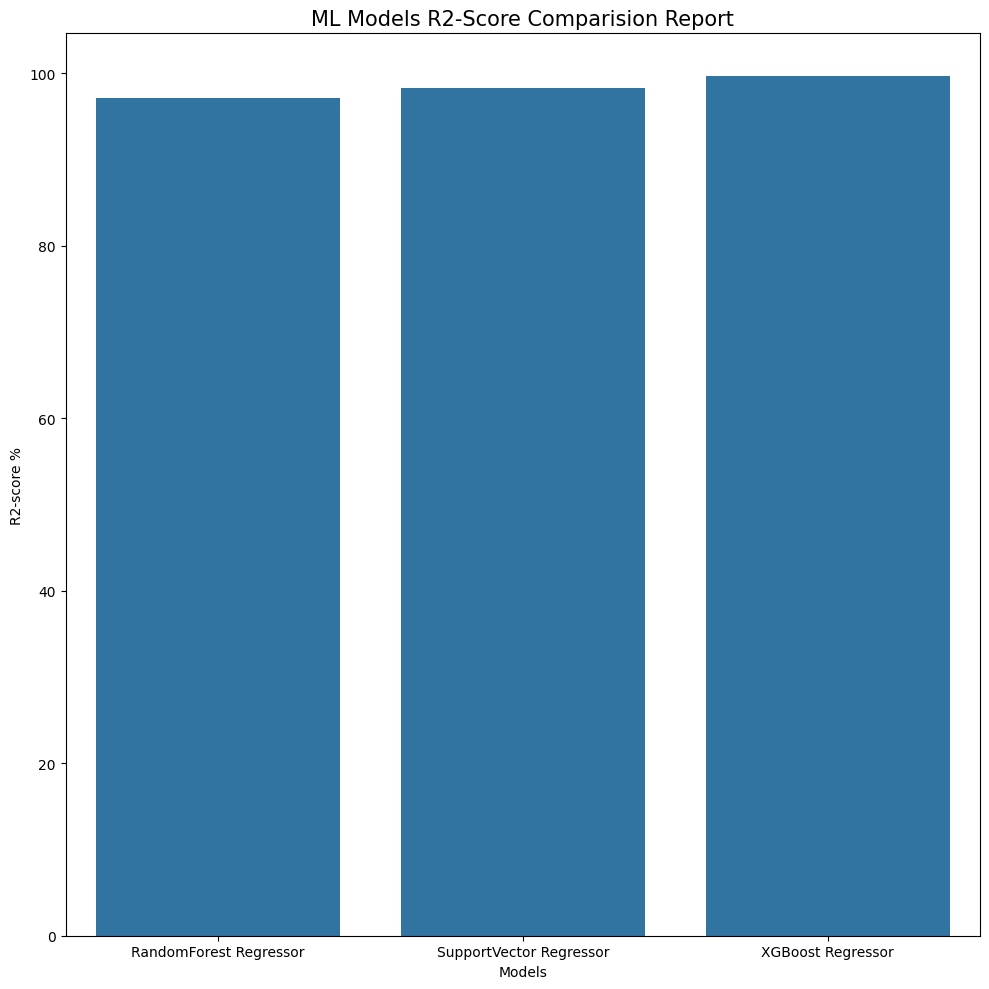

In [117]:
# Plotting the result 
plt.figure(figsize=(10,10))
sns.barplot(x=result['model'],y=result['R2-score %'])
plt.title('ML Models R2-Score Comparision Report',fontsize=15)
plt.xlabel('Models')
plt.ylabel('R2-score %')
plt.tight_layout()
plt.show()

## 10. Model Recommendation and Key Findings 


### Report Structure and Content Explanation:
* This report is structured to provide a clear, metric-driven comparison of the models. It begins with an introduction outlining the purpose. Each model then has its dedicated section, presenting its R-squared, MAE, MSE and RMSE values, along with a brief interpretation of what these metrics imply for that specific model's performance.
* A comparative table highlights the key metrics side-by-side for easy assessment. Finally, a recommendation section explicitly states the best model for production and justifies this choice based on the evidence presented in the performance metrics. This structure ensures that stakeholders can quickly grasp the models' performance, understand their relative strengths, and comprehend the rationale behind the final recommendation.

### Model Performance Summary
* Linear Regression was used as a baseline model, while Ridge Regression was introduced to handle multicollinearity by applying L2 regularization. Feature scaling(Standard Scaler) was applied before linear models to ensure stable coefficient estimation. Tree-based models were also explored to understand non-linear relationships, but the primary focus remained on interpretable linear models.

* Among all models, **eXtreme Gradient Boosting(XGB) Regressor** delivered the best performance with a R2 score of ~99% on Training Data and ~90% on the test data. The close alignment between training and testing R2 scores indicates strong generalization and no signs of underfitting or overfitting. Regularization helped stabilize the model while retaining predictive power, making Ridge Regression a suitable choice for this dataset.

### Challenges Faced & Key Learnings
Several challenges were encountered during the project:
* During the data analysis and preprocessing phase, several challenges were encountered and addressed to prepare the dataset for machine learning model training.
* Handling missing values for categorical data by creating a new category as `missing`.
* During Categorical Features encoding, I divided these features in 3 ways: `Binary`,`Nominal`,`Ordinal` features, so that I can easily encode these in to numerical values.
* Managing multicollinearity among highly correlated features.

Through these challenges, key learnings included the importance of validating data types after each preprocessing step, carefully defining evaluation functions, and selecting models based on both performance and interpretability rather than accuracy alone.


### Business & Data-Driven Suggestions

#### Interpretation of Important Features to Buy a House:

Feature importance, as derived from tree-based models like eXtremeGradientBoosting(XGB) Regressor, quantifies the contribution of each feature to the model's predictive accuracy. It is typically calculated based on how much each feature reduces impurity across all the decision trees in the ensemble. A higher importance value indicates that the feature plays a more significant role in determining the target variable (`SalePrice`).

**From the eXtreme Gradient Boosting Model, the top features and their importances for Buying a House:**

*   **SF(Square Feet) Related Features**: These features has the highest importance, indicating about the square feet area of the house (including basement, first, and second floors) is by far the most crucial factor in predicting sale price. This aligns with common real estate knowledge, as larger homes generally command higher prices.
*   **OverallQual (Overall Material and Finish Quality)**: The second most important feature, highlighting that the overall quality of materials and finishes significantly impacts the house price. High-quality construction and finishes are strongly associated with higher sale prices.
*   **Bathrooms (Number of Bathrooms) Related Features**: These features like full and half baths, showing that the number of bathrooms is a substantial contributor to a home's value. More bathrooms generally increase convenience and desirability, leading to higher prices.
*   **KitchenQual (Kitchen Quality)**: The quality of the kitchen (e.g., 'Ex', 'Gd', 'TA') is a very influential factor, suggesting that buyers place a high value on modern and well-appointed kitchens.
*   **BsmtQual (Basement Quality)**: Similar to KitchenQual, the quality of the basement (height and finish) is important, indicating that a well-finished and high-quality basement adds significant value.
*   **LotArea (Lot Size in Square Feet)**: The size of the lot is also an important factor, with larger lots often being more desirable and fetching higher prices.
*   **GarageCars (Size of garage in car capacity)**: The capacity of the garage is a significant predictor, reflecting the value buyers place on adequate parking and storage space.
*   **GrLivArea (Above grade (ground) living area square feet)**: This is another measure of living space, reinforcing that the amount of living area above ground is crucial for pricing.
*   **YrBuilt**: The age of the house (calculated as `YrSold - YearBuilt`) influences price, with newer homes often being more valuable due to modern designs and fewer maintenance issues.
*   **FireplaceQu (Fireplace Quality)**: The quality of the fireplace is also a notable factor, suggesting that a well-maintained or high-quality fireplace adds to a home's appeal.
*   **OverallCond (Overall Condition Score)**: The general condition of the house, though less impactful than overall quality, still plays a role in its valuation.
*   **CentralAir_Y (Central Air Conditioning)**: The presence of central air conditioning is a positive predictor of sale price, indicating its importance for comfort and modern living standards.
*   **YearsSinceRemodel (Years Since Remodel)**: This feature (calculated as `YrSold - YearRemodAdd`) suggests that more recent remodels tend to increase the sale price.
*   **YearRemodAdd (Remodel Date)**: The year of remodel also has an independent impact, emphasizing the importance of updates and renovations.
*   **GarageArea (Size of garage in square feet)**: The physical area of the garage, alongside its car capacity, is important, indicating that larger garages are more desirable.

### Recommendation for Production
Based on the comprehensive evaluation, the **eXtremeGradientBoosting(XGB) Regressor** is recommended for production deployment. Its superior R-squared (~99%), coupled with the lowest MAE (0.0154), MSE (0.0004) and RMSE(0.0205) demonstrates its ability to capture complex patterns in the data and provide the most accurate and reliable price predictions. While _Support Vector Regressor_ and _Random Forest Regressor_ also performed well, _eXtreme Gradient Boosting(XGB) Regressor_ consistently delivered slightly better results across the board, making it the most robust choice for this prediction task.


# &emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;Modeling Completed